# GAN with KL Divergence

In [0]:
import tensorflow as tf
from tensorflow.examples.tutorials.mnist import input_data
import keras.models
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
from google.colab import files

from sklearn.neighbors import KNeighborsClassifier

%matplotlib inline

## Weights and Placeholders

In [0]:
def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / tf.sqrt(in_dim / 2.)
    return tf.random_normal(shape=size, stddev=xavier_stddev)

In [0]:
X = tf.placeholder(tf.float32, shape=[None, 784])

D_W1 = tf.Variable(xavier_init([784, 128]))
D_b1 = tf.Variable(tf.zeros(shape=[128]))

D_W2 = tf.Variable(xavier_init([128, 1]))
D_b2 = tf.Variable(tf.zeros(shape=[1]))

theta_D = [D_W1, D_W2, D_b1, D_b2]

Z = tf.placeholder(tf.float32, shape=[None, 100])

G_W1 = tf.Variable(xavier_init([100, 128]))
G_b1 = tf.Variable(tf.zeros(shape=[128]))

G_W2 = tf.Variable(xavier_init([128, 784]))
G_b2 = tf.Variable(tf.zeros(shape=[784]))

theta_G = [G_W1, G_W2, G_b1, G_b2]

## Load Data

In [0]:
mb_size = 128
Z_dim = 100
n_classes = 10


In [0]:
# mnist = input_data.read_data_sets('../../MNIST_data', one_hot=True)
# From nowonwards mnist is fashion-mnist!
mnist = input_data.read_data_sets('data/fashion', source_url='http://fashion-mnist.s3-website.eu-central-1.amazonaws.com/', one_hot=True)

## Pretrained Classifier
(for coverage metrics)

In [0]:
(x_sample, y_sample) = mnist.train.next_batch(60000)

knn_model = KNeighborsClassifier(n_neighbors=3)
knn_model.fit(x_sample, y_sample)

(x_val, y_val) = mnist.validation.next_batch(10000)

score = knn_model.score(x_val, y_val)
print("accuracy=%.2f%%" % (score * 100))

In [0]:
distr = tf.contrib.distributions

def prob_distr(img_batch):
  img_classes = knn_model.predict(img_batch)
  totals = np.sum(img_classes, axis=0)
  return totals/np.sum(totals)

def kl_divergence(img_batch):
  
  #prob distr of samples
  gen_pd = prob_distr(img_batch) 
  
  # number of modes covered in samples
  modes_covered = sum(1 for p in gen_pd if p > 0) 
  
  # kl divergence
  tiny_e = 1e-5
  gen_pd_epsilon = gen_pd + tiny_e
  data_pd = np.full((n_classes,),(1/n_classes)) + tiny_e
  kl = np.sum(gen_pd_epsilon * np.log(gen_pd_epsilon / data_pd)) 
  rev_kl = np.sum(data_pd * np.log(data_pd / gen_pd_epsilon)) 
  
  return kl, rev_kl, gen_pd, modes_covered

## Model 

### Architectures

In [0]:
def sample_Z(m, n):
    return np.random.uniform(-1., 1., size=[m, n])


def generator(z):
    G_h1 = tf.nn.relu(tf.matmul(z, G_W1) + G_b1)
    G_log_prob = tf.matmul(G_h1, G_W2) + G_b2
    G_prob = tf.nn.sigmoid(G_log_prob)

    return G_prob


def discriminator(x):
    D_h1 = tf.nn.relu(tf.matmul(x, D_W1) + D_b1)
    D_logit = tf.matmul(D_h1, D_W2) + D_b2
    D_prob = tf.nn.sigmoid(D_logit)

    return D_prob, D_logit


def plot(samples):
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(10, 10)
    gs.update(wspace=0.1, hspace=0.1)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

    return fig

### Loss functions

In [0]:
G_sample = generator(Z)
D_real, D_logit_real = discriminator(X)
D_fake, D_logit_fake = discriminator(G_sample)

# D_loss = -tf.reduce_mean(tf.log(D_real) + tf.log(1. - D_fake))
# G_loss = -tf.reduce_mean(tf.log(D_fake))

# Alternative losses:
# -------------------
D_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_real, labels=tf.ones_like(D_logit_real)))
D_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_fake, labels=tf.zeros_like(D_logit_fake)))
D_loss = D_loss_real + D_loss_fake
G_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=D_logit_fake, labels=tf.ones_like(D_logit_fake)))

D_solver = tf.train.AdamOptimizer().minimize(D_loss, var_list=theta_D)
G_solver = tf.train.AdamOptimizer().minimize(G_loss, var_list=theta_G)

#KL = distr.kl_divergence(distr.Categorical(probs=prob_distr(G_sample)), distr.Categorical(probs= np.full((n_classes,),(1/n_classes))), allow_nan_stats=True)

## Training Session

In [0]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())

In [0]:
if not os.path.exists('out/'):
    os.makedirs('out/')

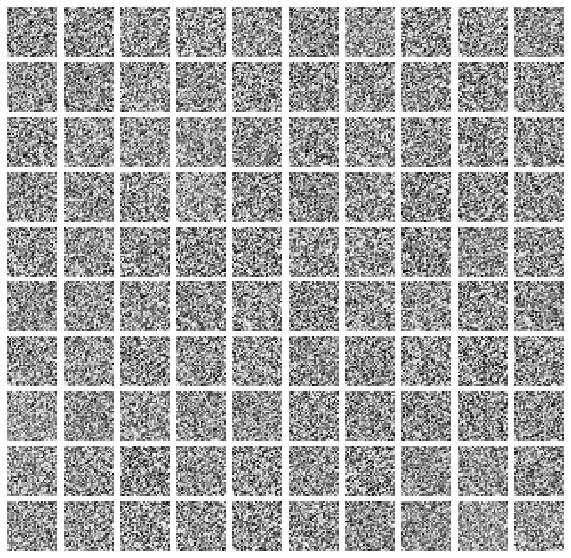

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


Iter: 0
D loss: 1.943
G_loss: 1.567
KL Div: nan
Reverse KL Div: nan



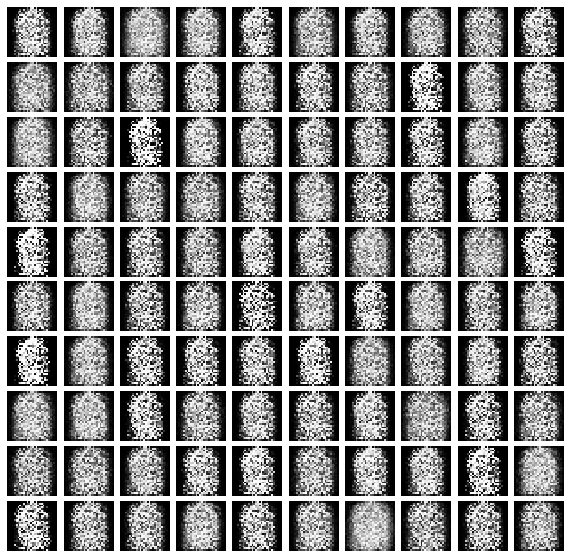

Iter: 1000
D loss: 0.1553
G_loss: 4.786
KL Div: 1.264
Reverse KL Div: 5.393



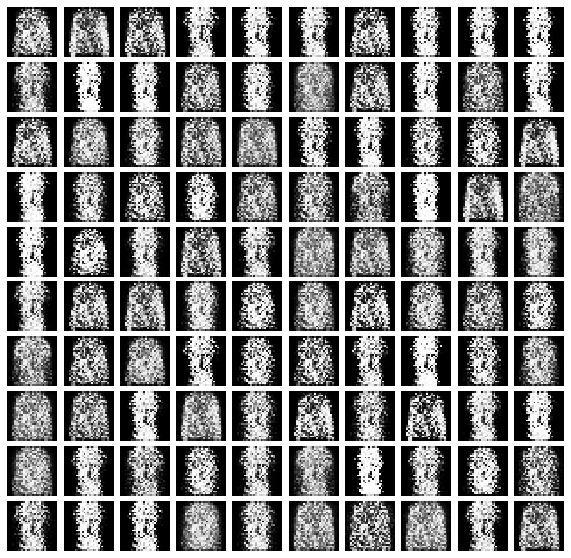

Iter: 2000
D loss: 0.1154
G_loss: 6.393
KL Div: 0.732
Reverse KL Div: 3.537



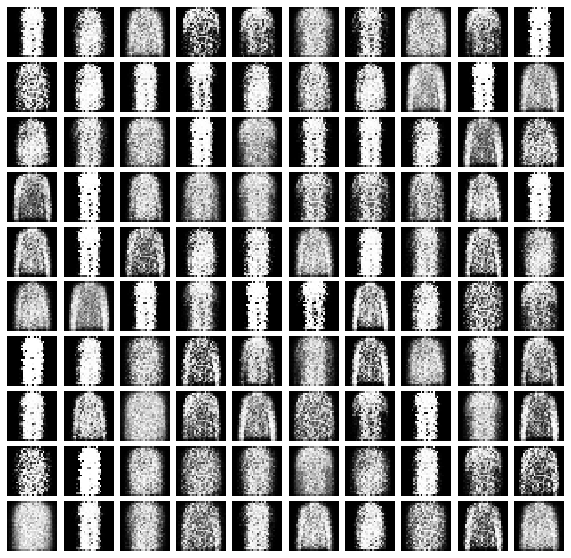

Iter: 3000
D loss: 0.3329
G_loss: 4.152
KL Div: 0.6511
Reverse KL Div: 3.471



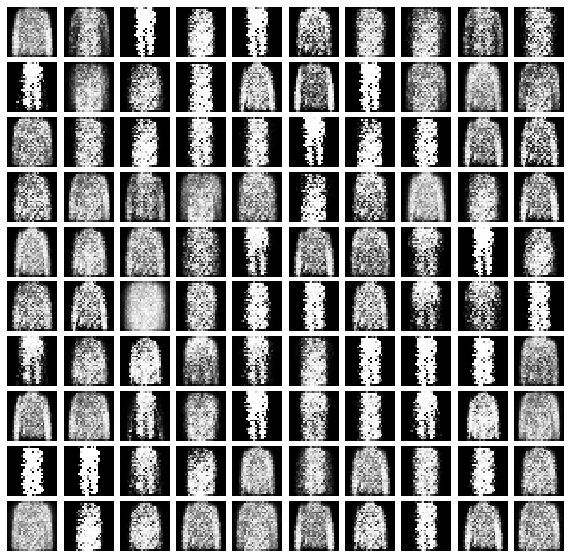

Iter: 4000
D loss: 0.2871
G_loss: 5.246
KL Div: 0.6231
Reverse KL Div: 3.455



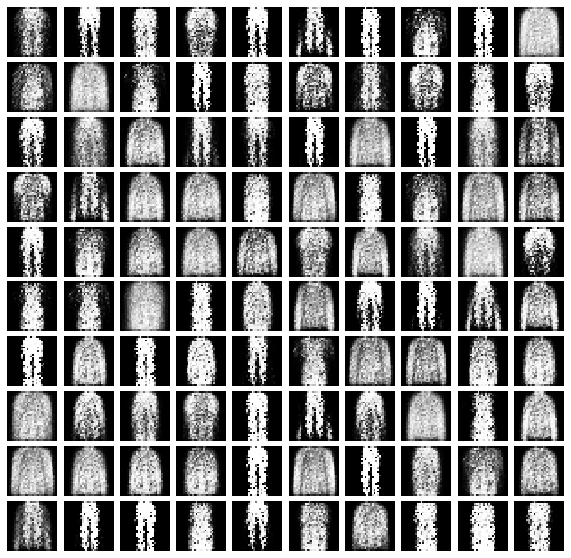

Iter: 5000
D loss: 0.4304
G_loss: 3.339
KL Div: 0.6258
Reverse KL Div: 3.465



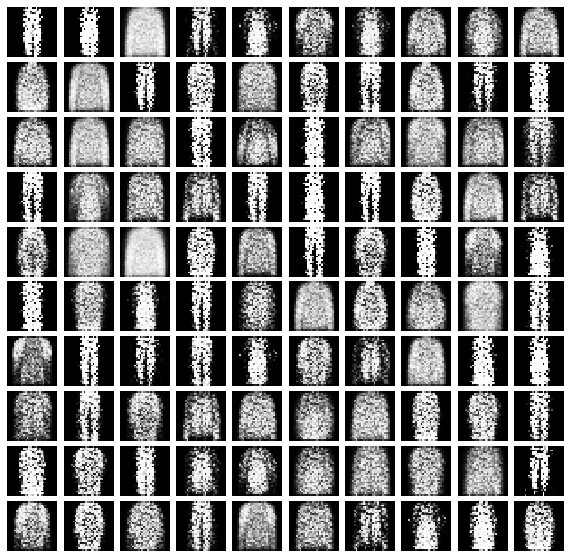

Iter: 6000
D loss: 0.6145
G_loss: 5.288
KL Div: 0.7313
Reverse KL Div: 3.525



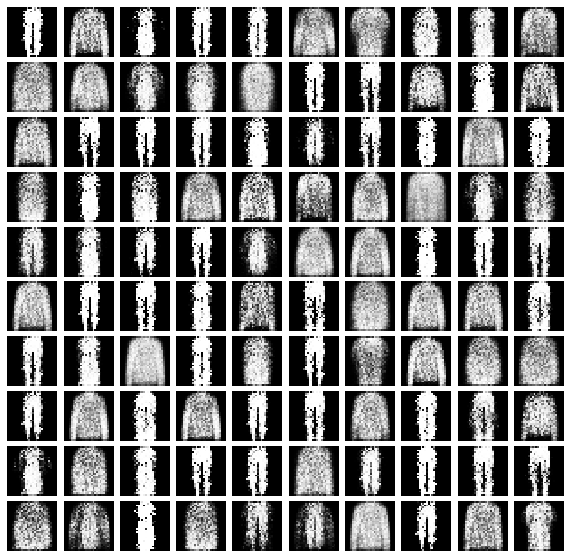

Iter: 7000
D loss: 0.6492
G_loss: 3.133
KL Div: 0.621
Reverse KL Div: 3.44



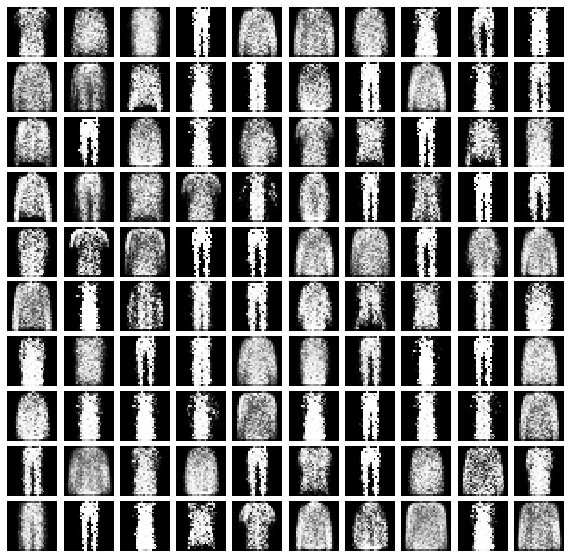

Iter: 8000
D loss: 0.4128
G_loss: 4.068
KL Div: 0.6196
Reverse KL Div: 3.435



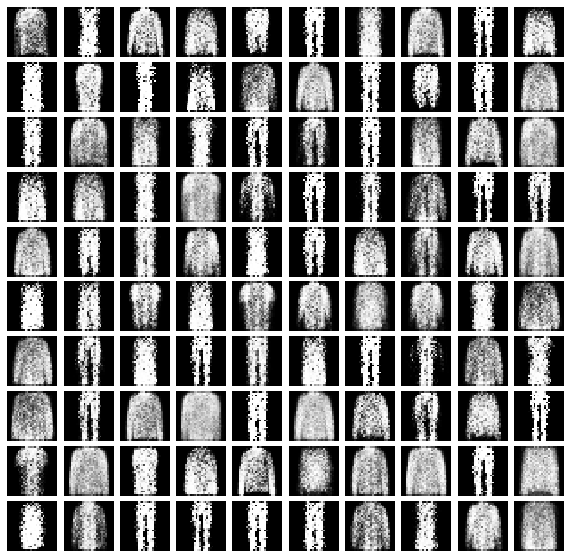

Iter: 9000
D loss: 0.5465
G_loss: 3.669
KL Div: 0.6465
Reverse KL Div: 3.45



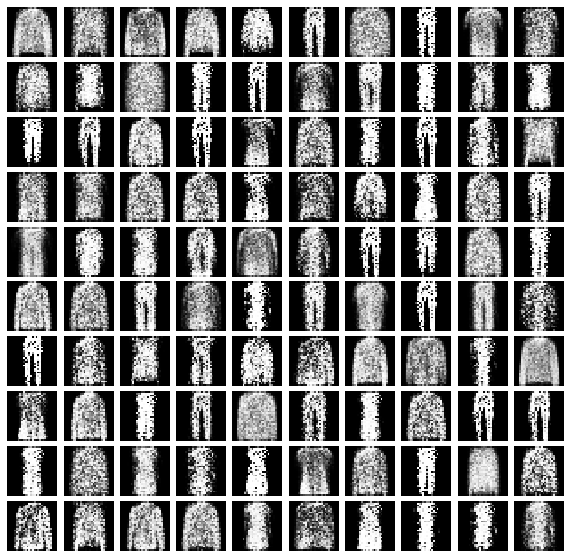

Iter: 10000
D loss: 0.5418
G_loss: 4.108
KL Div: 0.6023
Reverse KL Div: 3.442



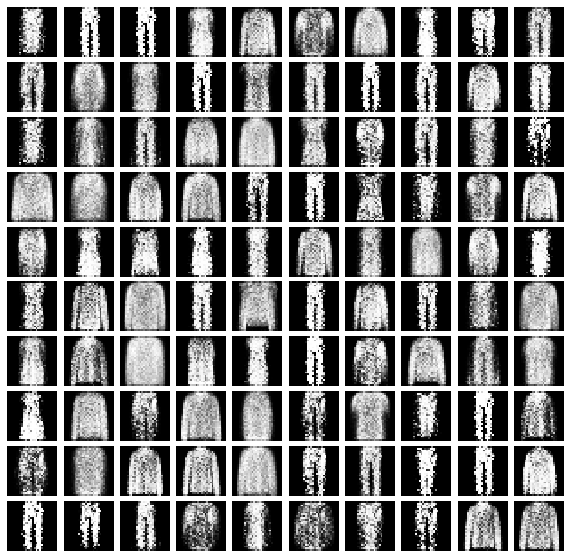

Iter: 11000
D loss: 0.7649
G_loss: 2.652
KL Div: 0.6003
Reverse KL Div: 2.83



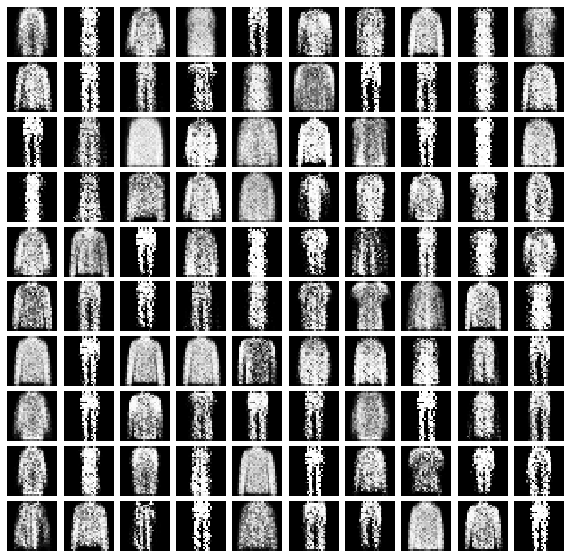

Iter: 12000
D loss: 0.4936
G_loss: 2.768
KL Div: 0.5739
Reverse KL Div: 3.419



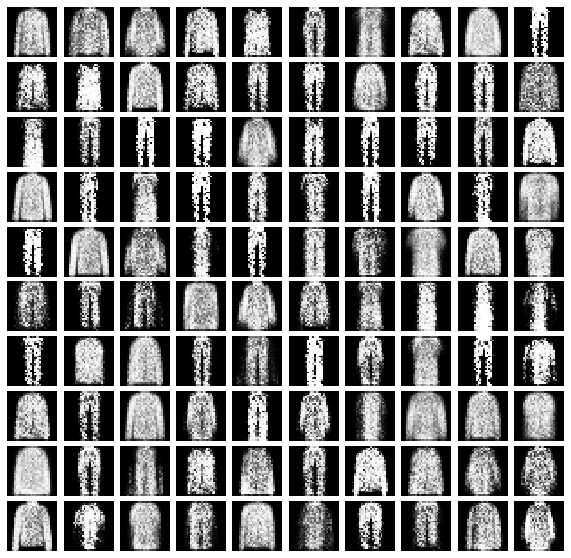

Iter: 13000
D loss: 0.4356
G_loss: 4.163
KL Div: 0.622
Reverse KL Div: 3.441



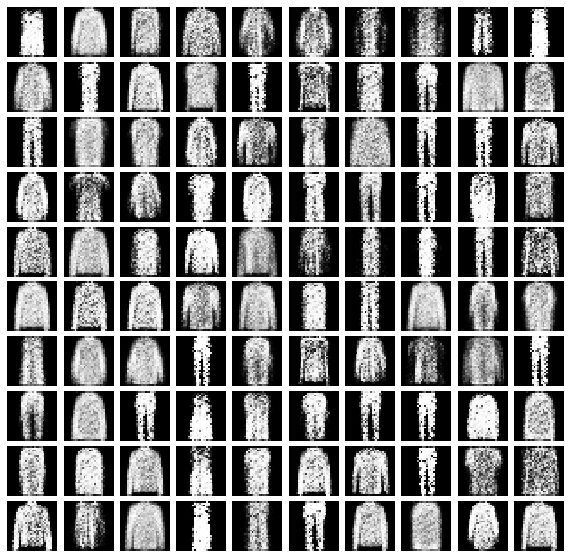

Iter: 14000
D loss: 0.7824
G_loss: 2.778
KL Div: 0.6412
Reverse KL Div: 3.488



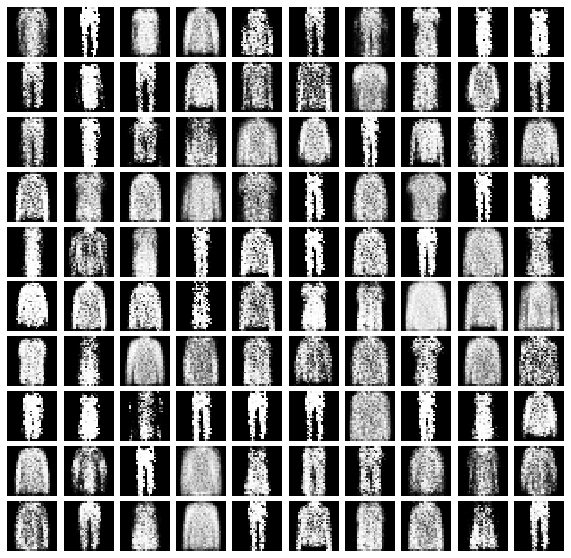

Iter: 15000
D loss: 0.6916
G_loss: 2.736
KL Div: 0.5246
Reverse KL Div: 3.387



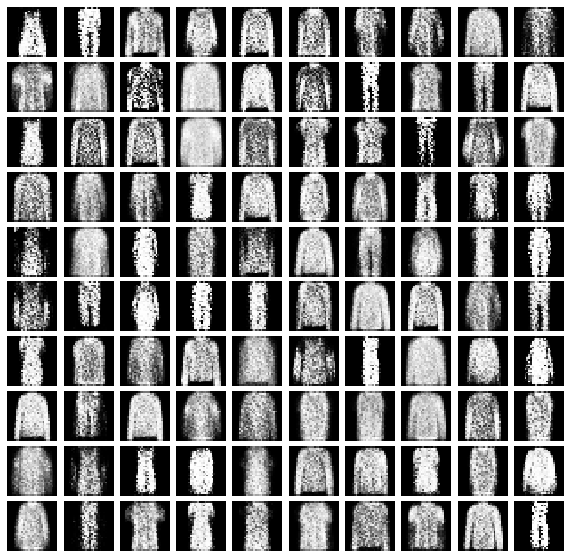

Iter: 16000
D loss: 0.8197
G_loss: 2.602
KL Div: 0.6128
Reverse KL Div: 3.446



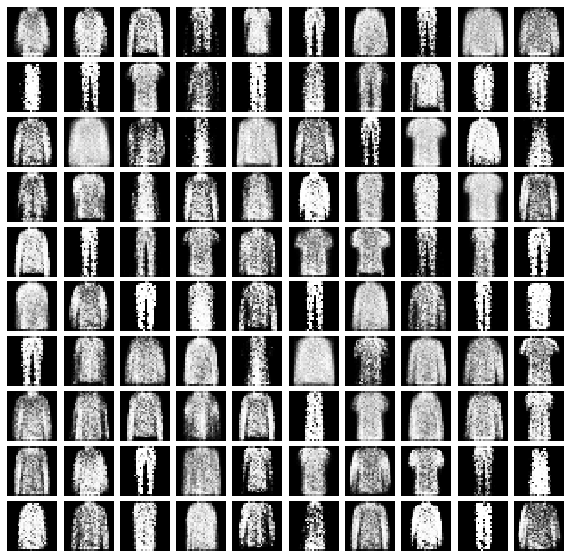

Iter: 17000
D loss: 0.6925
G_loss: 2.668
KL Div: 0.5158
Reverse KL Div: 2.688



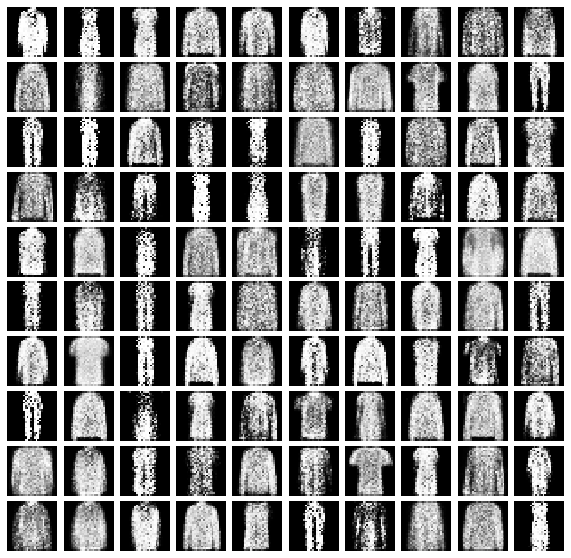

Iter: 18000
D loss: 0.9483
G_loss: 2.274
KL Div: 0.5
Reverse KL Div: 2.659



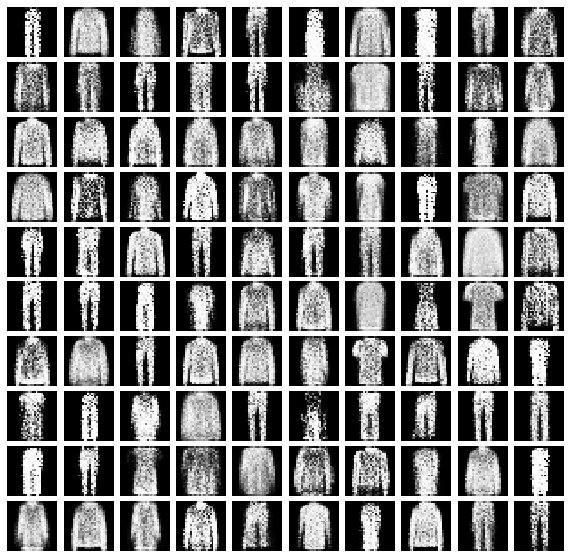

Iter: 19000
D loss: 0.985
G_loss: 2.614
KL Div: 0.5318
Reverse KL Div: 2.728



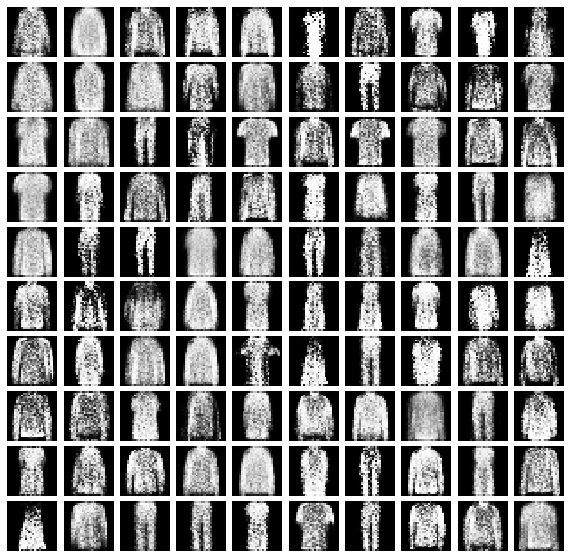

Iter: 20000
D loss: 0.8172
G_loss: 2.673
KL Div: 0.4486
Reverse KL Div: 2.605



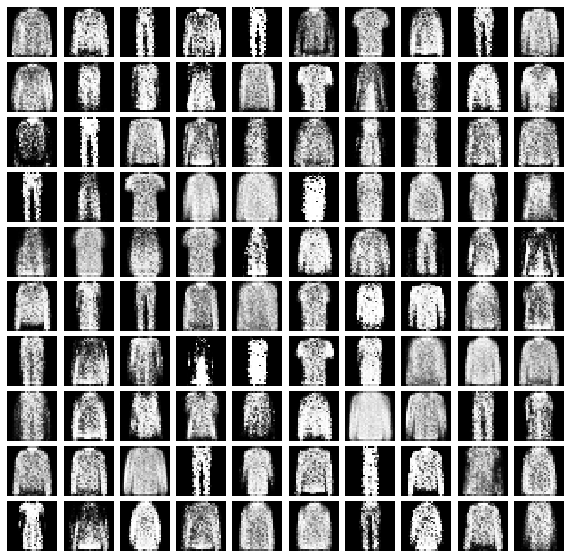

Iter: 21000
D loss: 0.9516
G_loss: 2.383
KL Div: 0.4629
Reverse KL Div: 2.653



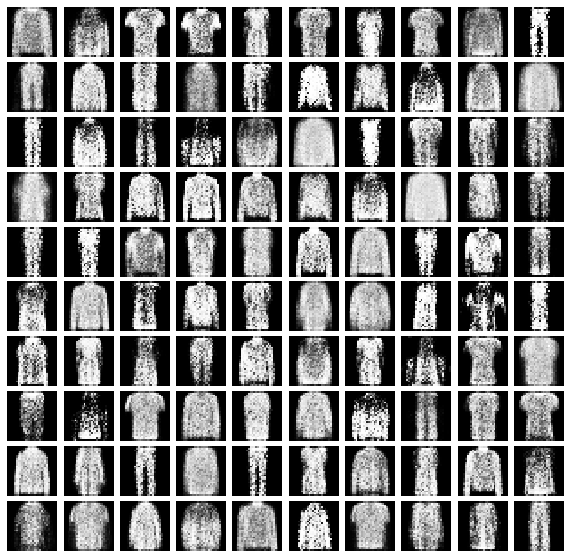

Iter: 22000
D loss: 0.7313
G_loss: 3.236
KL Div: 0.4367
Reverse KL Div: 2.59



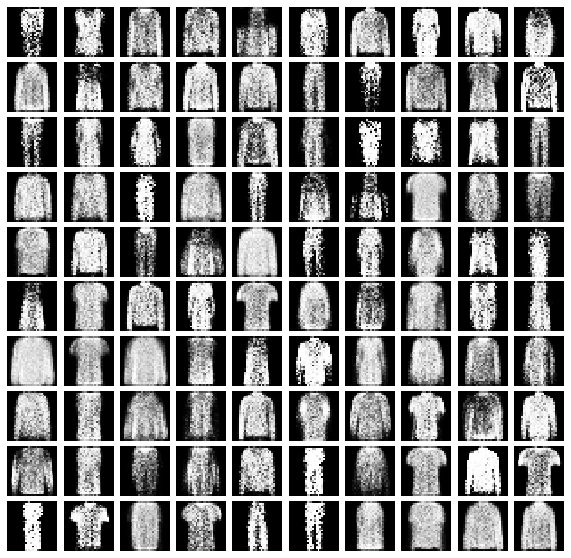

Iter: 23000
D loss: 0.6428
G_loss: 3.207
KL Div: 0.4395
Reverse KL Div: 2.607



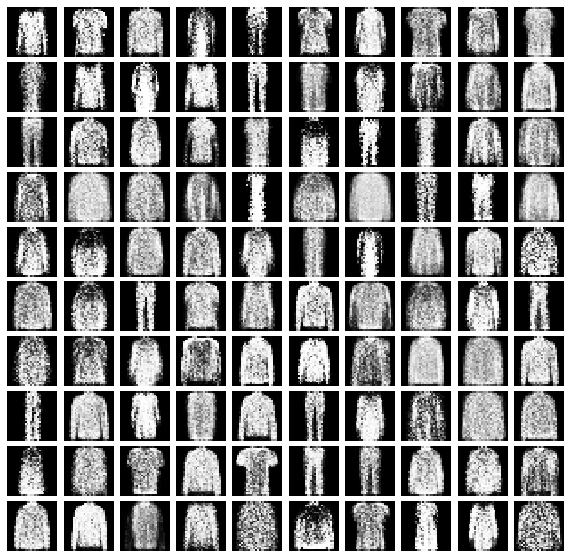

Iter: 24000
D loss: 0.7952
G_loss: 1.802
KL Div: 0.4355
Reverse KL Div: 2.595



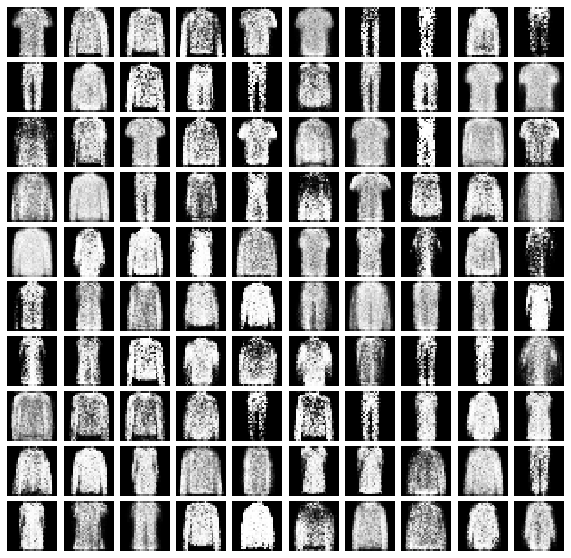

Iter: 25000
D loss: 0.8039
G_loss: 1.752
KL Div: 0.5211
Reverse KL Div: 3.384



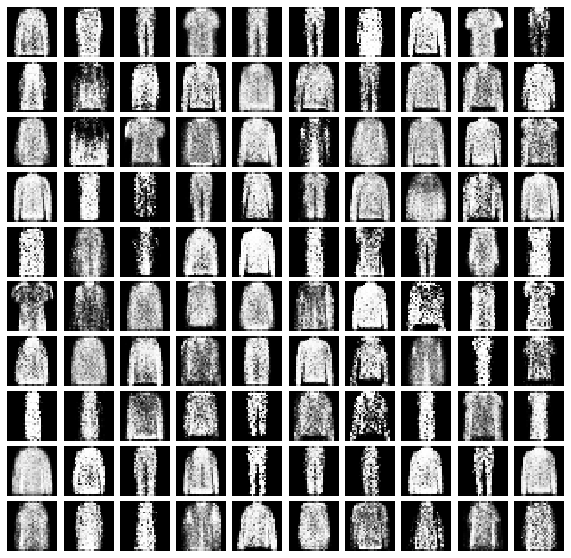

Iter: 26000
D loss: 1.029
G_loss: 2.384
KL Div: 0.4587
Reverse KL Div: 2.651



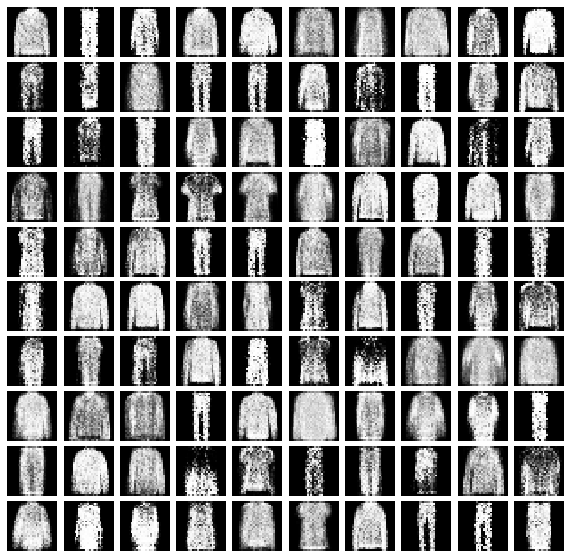

Iter: 27000
D loss: 0.8386
G_loss: 2.274
KL Div: 0.5086
Reverse KL Div: 2.764



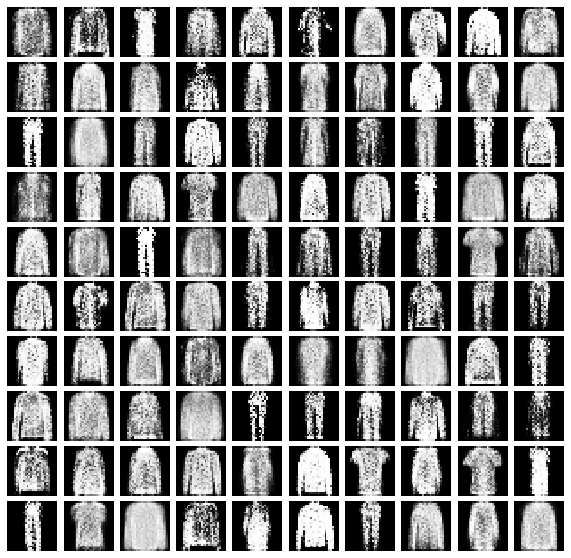

Iter: 28000
D loss: 0.7594
G_loss: 2.358
KL Div: 0.47
Reverse KL Div: 2.656



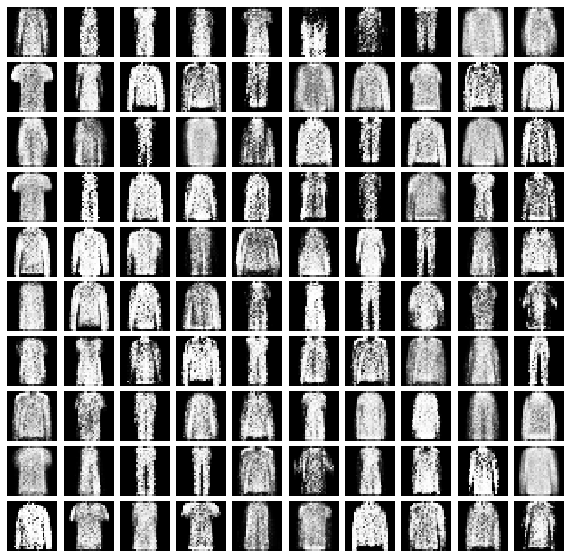

Iter: 29000
D loss: 0.7107
G_loss: 1.93
KL Div: 0.5002
Reverse KL Div: 2.705



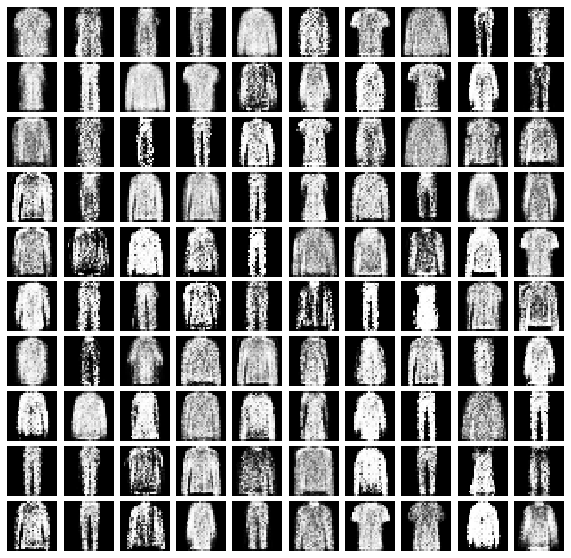

Iter: 30000
D loss: 0.7591
G_loss: 1.779
KL Div: 0.523
Reverse KL Div: 3.386



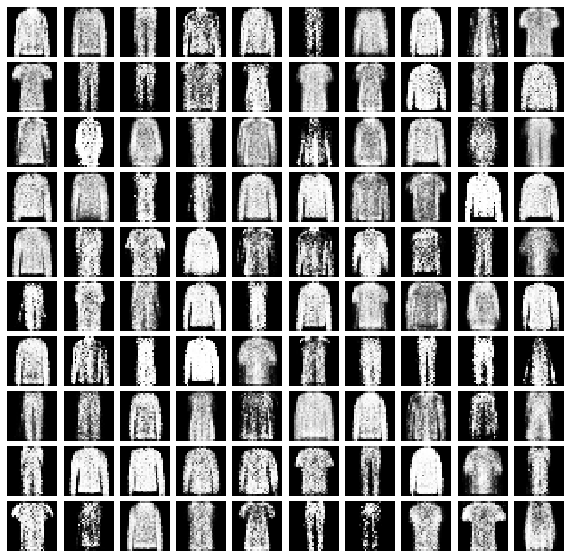

Iter: 31000
D loss: 0.91
G_loss: 2.113
KL Div: 0.4626
Reverse KL Div: 2.636



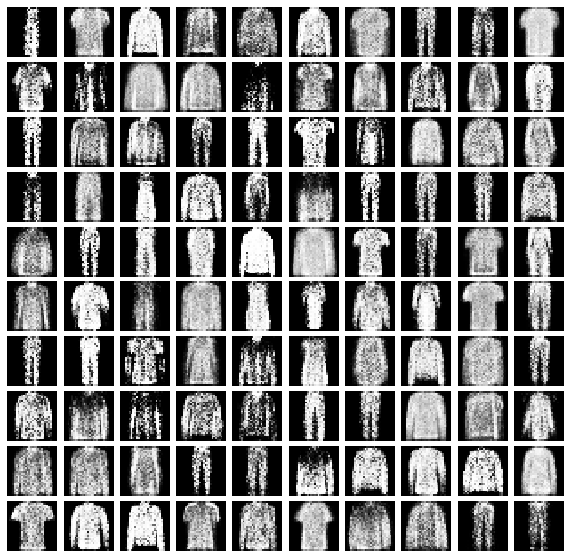

Iter: 32000
D loss: 0.8176
G_loss: 2.16
KL Div: 0.4865
Reverse KL Div: 2.697



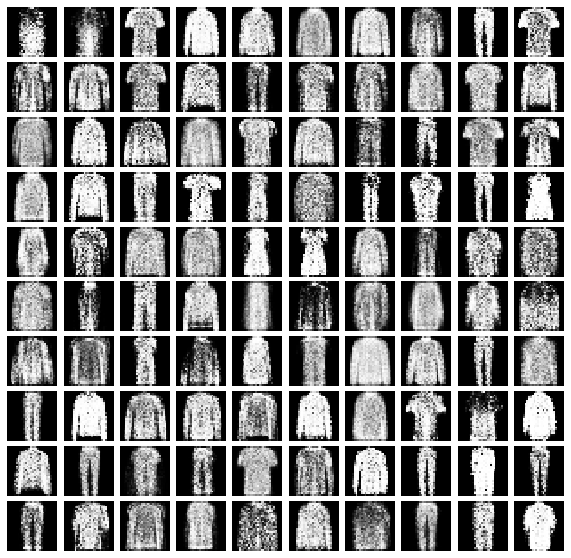

Iter: 33000
D loss: 1.089
G_loss: 1.59
KL Div: 0.467
Reverse KL Div: 2.656



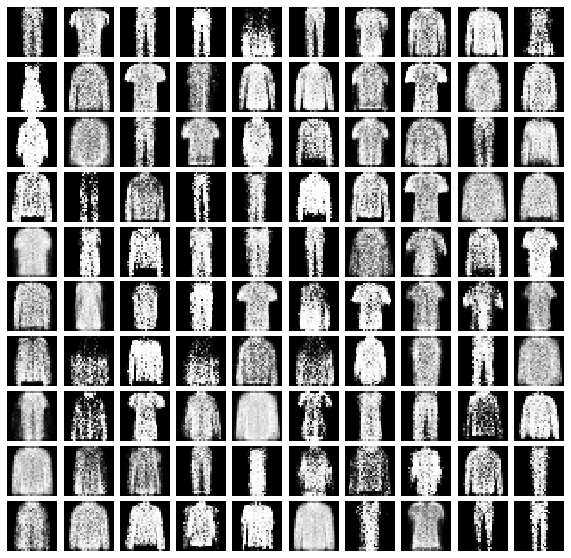

Iter: 34000
D loss: 1.183
G_loss: 1.788
KL Div: 0.4833
Reverse KL Div: 2.667



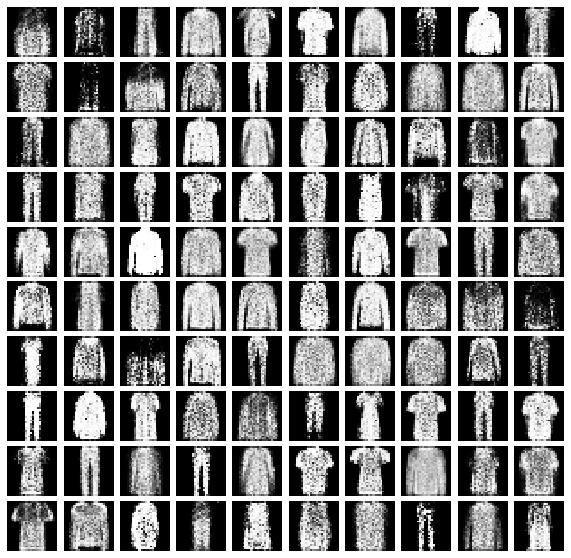

Iter: 35000
D loss: 0.8895
G_loss: 2.298
KL Div: 0.4525
Reverse KL Div: 2.616



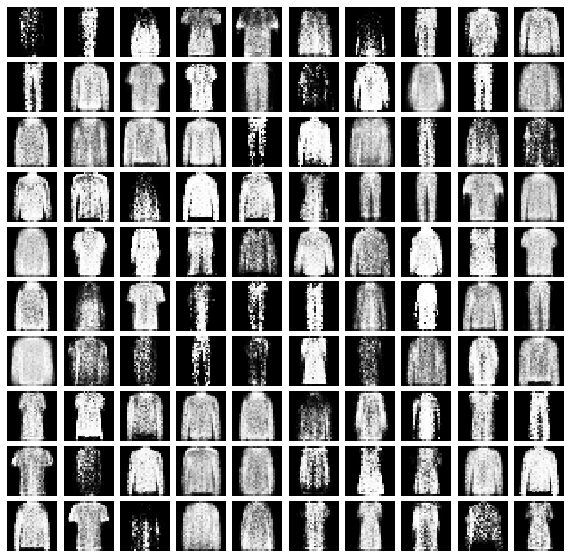

Iter: 36000
D loss: 0.8278
G_loss: 1.609
KL Div: 0.4804
Reverse KL Div: 2.693



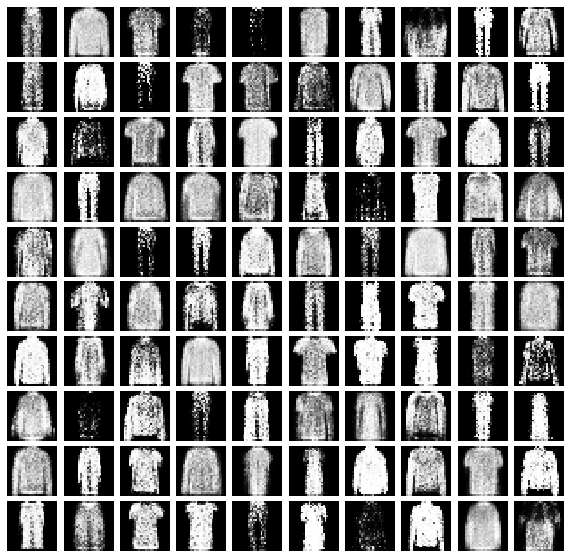

Iter: 37000
D loss: 0.7722
G_loss: 2.343
KL Div: 0.4462
Reverse KL Div: 2.605



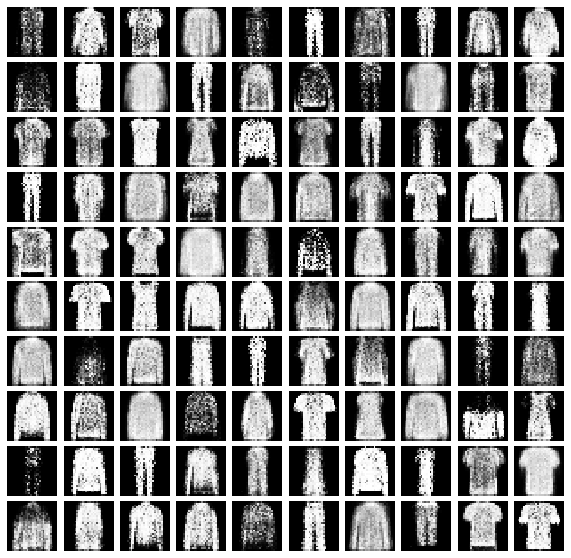

Iter: 38000
D loss: 0.7811
G_loss: 1.485
KL Div: 0.4393
Reverse KL Div: 2.599



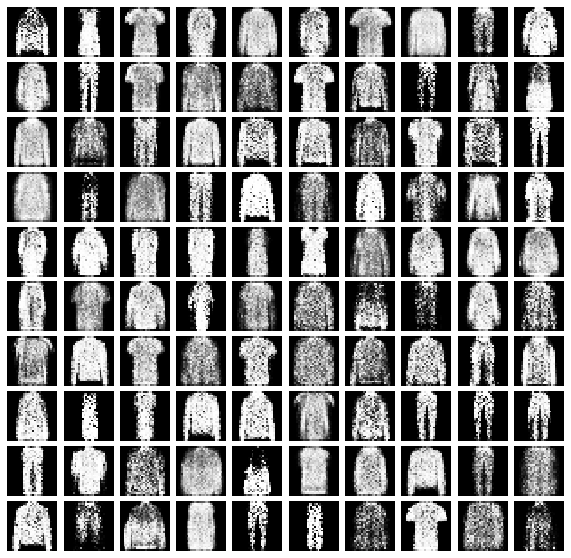

Iter: 39000
D loss: 1.053
G_loss: 2.378
KL Div: 0.4289
Reverse KL Div: 2.585



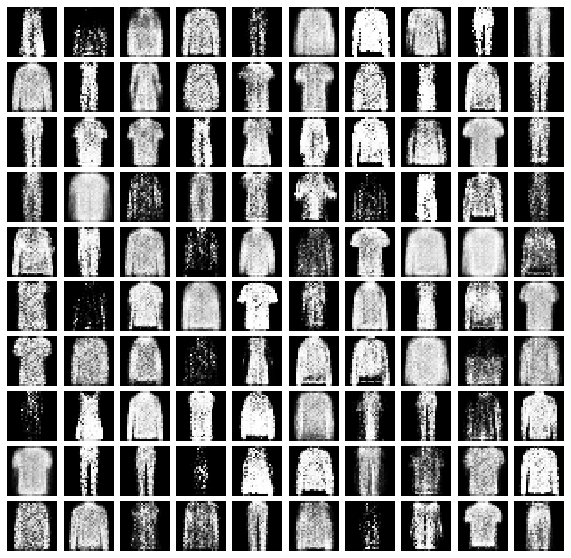

Iter: 40000
D loss: 0.788
G_loss: 1.458
KL Div: 0.4488
Reverse KL Div: 2.615



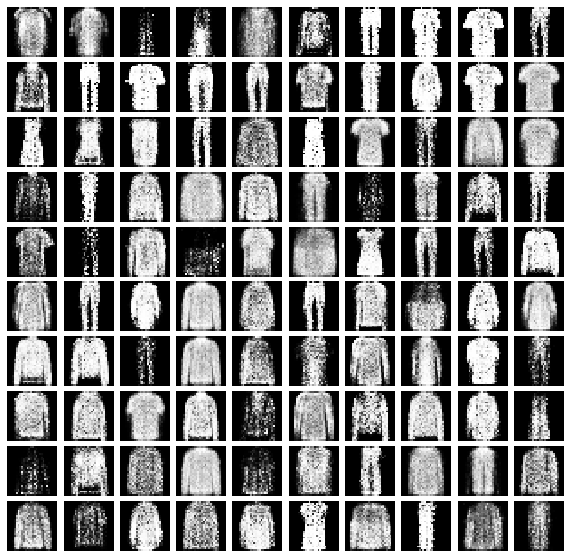

Iter: 41000
D loss: 1.138
G_loss: 1.62
KL Div: 0.5113
Reverse KL Div: 2.768



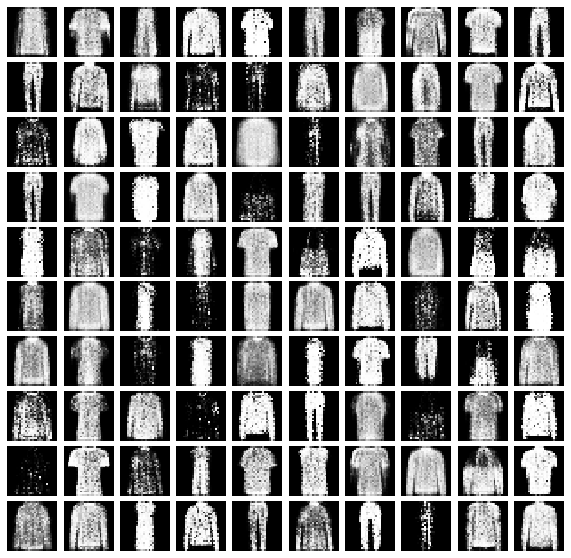

Iter: 42000
D loss: 0.915
G_loss: 1.882
KL Div: 0.4497
Reverse KL Div: 2.604



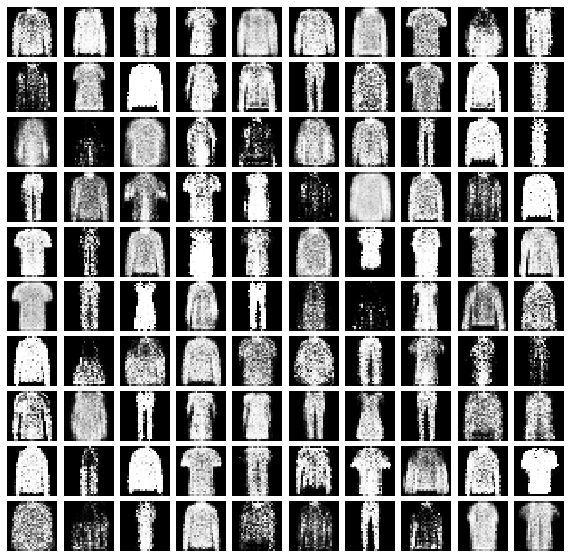

Iter: 43000
D loss: 0.7131
G_loss: 2.17
KL Div: 0.4854
Reverse KL Div: 2.696



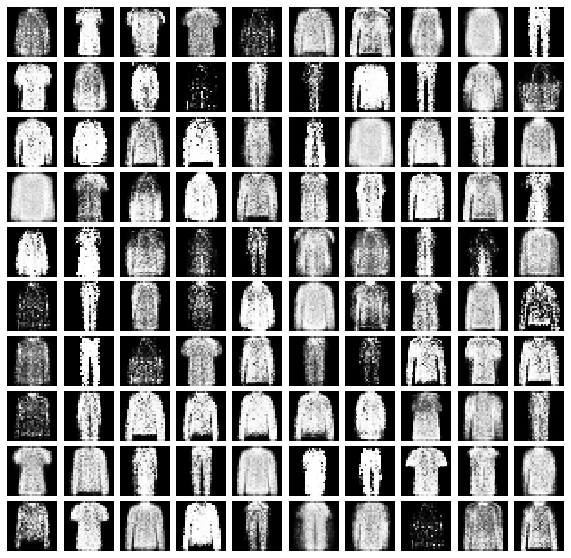

Iter: 44000
D loss: 0.9407
G_loss: 1.566
KL Div: 0.4494
Reverse KL Div: 2.606



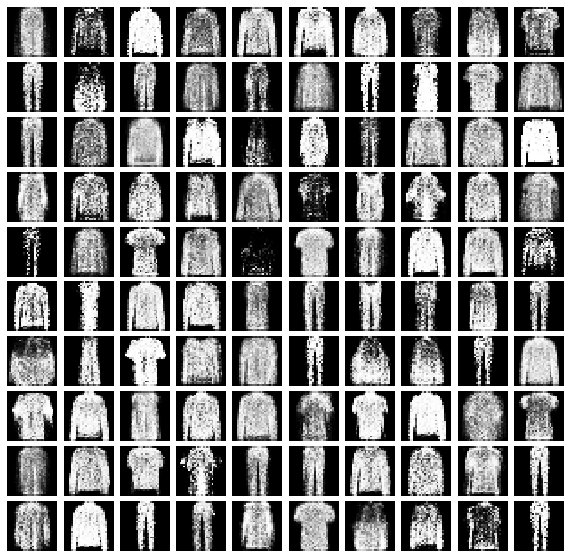

Iter: 45000
D loss: 0.9409
G_loss: 1.595
KL Div: 0.4808
Reverse KL Div: 2.663



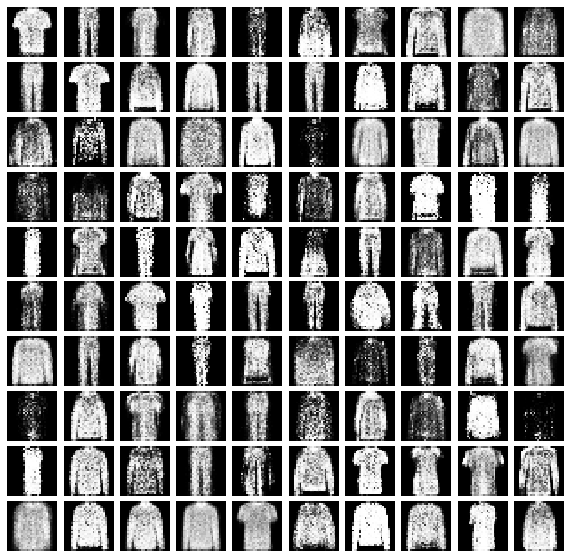

Iter: 46000
D loss: 0.8906
G_loss: 1.363
KL Div: 0.4278
Reverse KL Div: 2.575



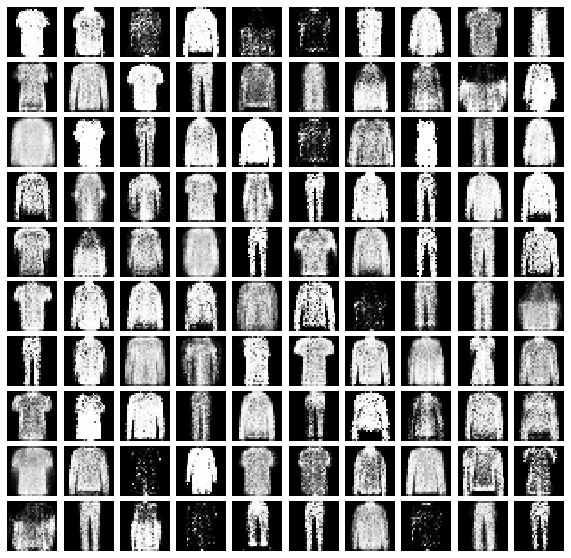

Iter: 47000
D loss: 0.9698
G_loss: 1.764
KL Div: 0.4575
Reverse KL Div: 2.61



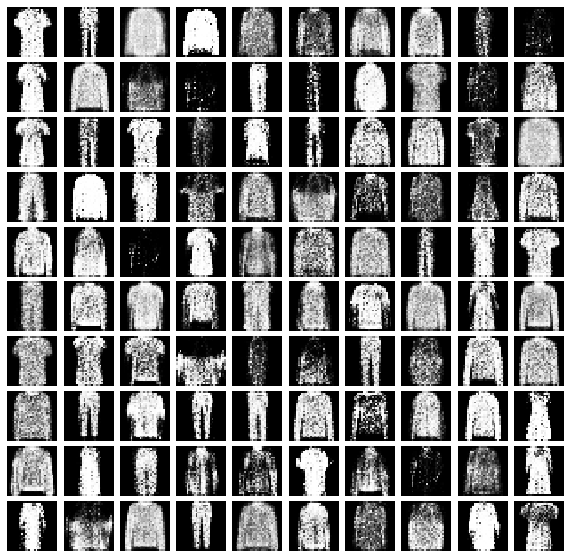

Iter: 48000
D loss: 1.016
G_loss: 1.928
KL Div: 0.4738
Reverse KL Div: 2.659



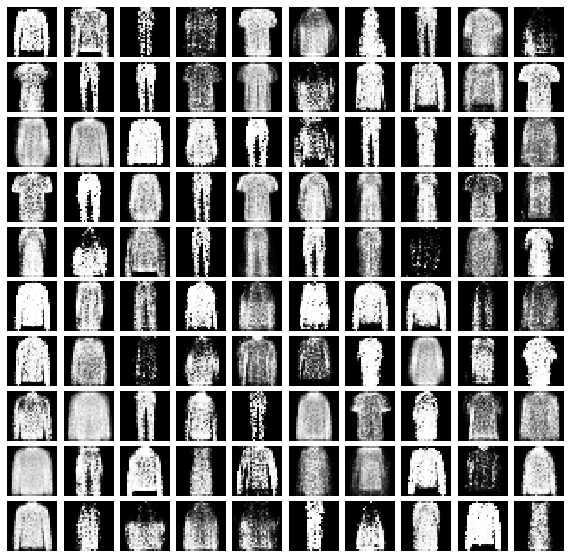

Iter: 49000
D loss: 0.8045
G_loss: 1.678
KL Div: 0.4725
Reverse KL Div: 2.629



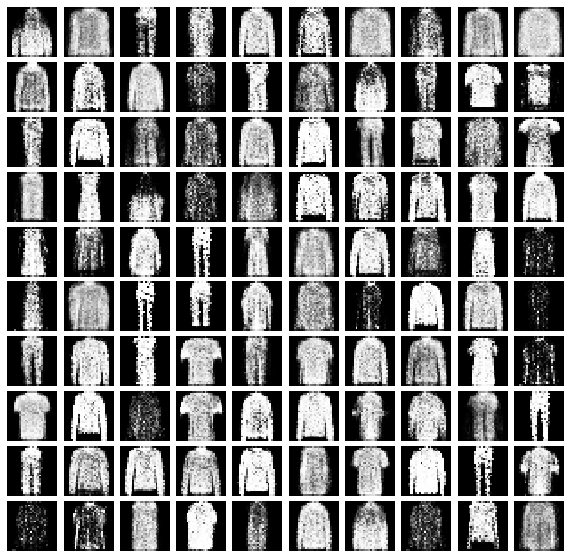

Iter: 50000
D loss: 0.7904
G_loss: 2.129
KL Div: 0.5122
Reverse KL Div: 2.685



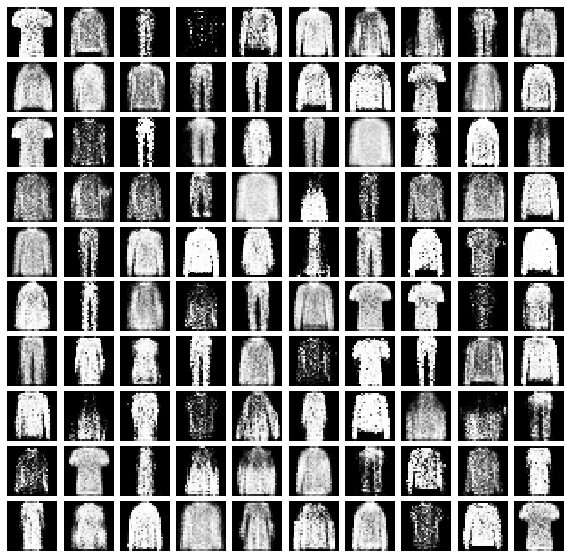

Iter: 51000
D loss: 0.9934
G_loss: 1.942
KL Div: 0.4849
Reverse KL Div: 2.666



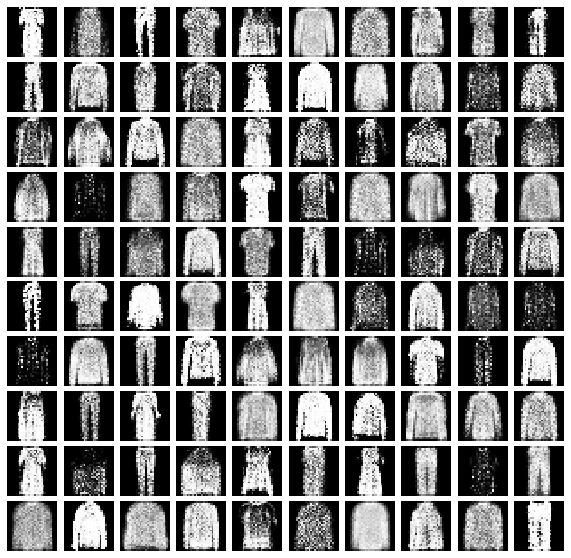

Iter: 52000
D loss: 1.176
G_loss: 1.675
KL Div: 0.4789
Reverse KL Div: 2.632



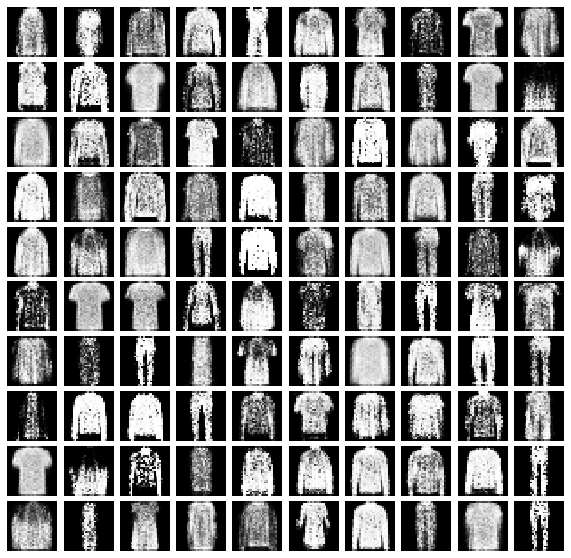

Iter: 53000
D loss: 0.971
G_loss: 1.686
KL Div: 0.4434
Reverse KL Div: 2.589



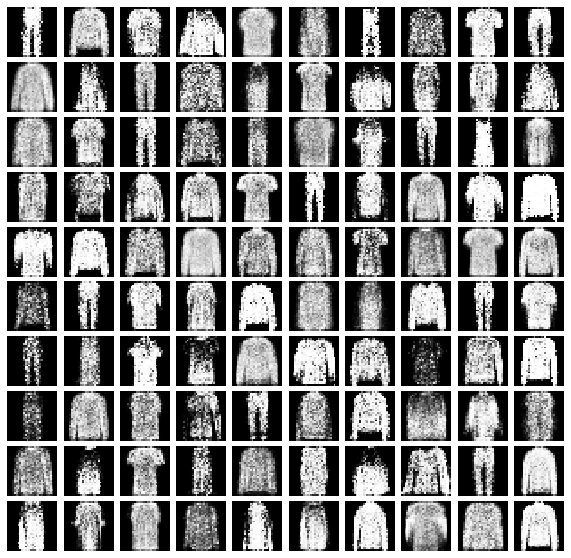

Iter: 54000
D loss: 1.043
G_loss: 1.75
KL Div: 0.4296
Reverse KL Div: 2.585



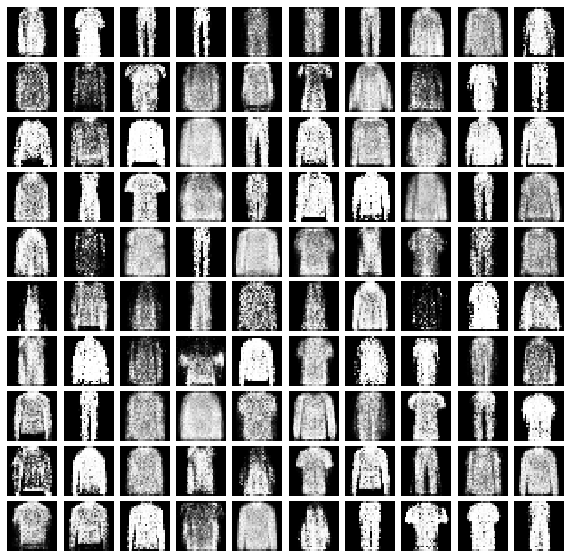

Iter: 55000
D loss: 0.9115
G_loss: 1.598
KL Div: 0.4568
Reverse KL Div: 2.618



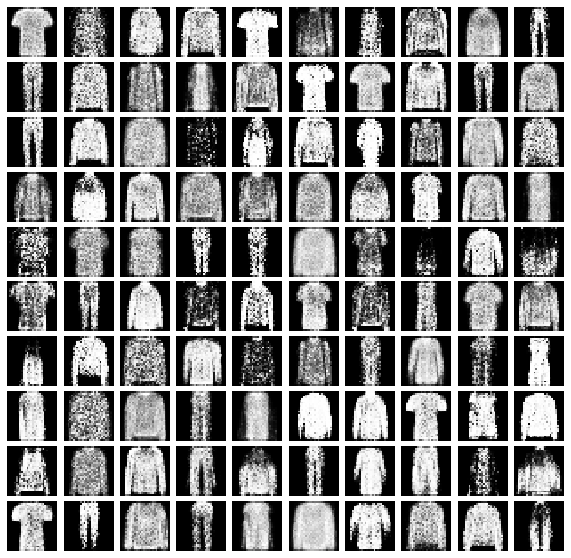

Iter: 56000
D loss: 0.7376
G_loss: 2.136
KL Div: 0.4246
Reverse KL Div: 2.573



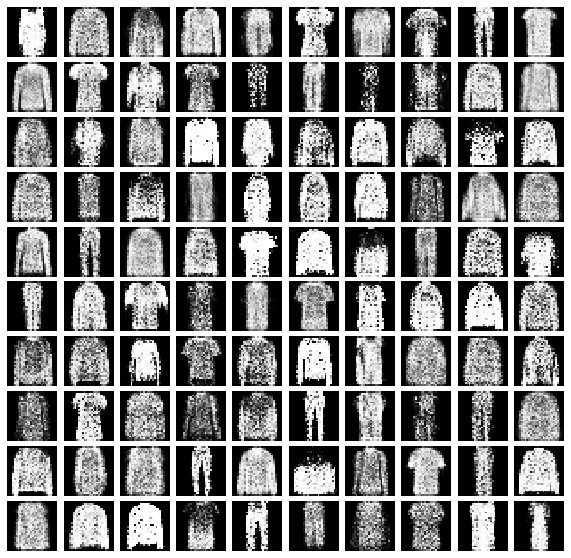

Iter: 57000
D loss: 0.9712
G_loss: 1.984
KL Div: 0.4527
Reverse KL Div: 2.606



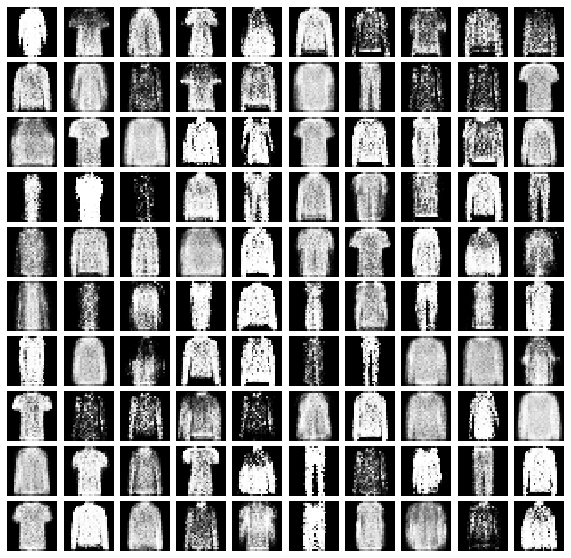

Iter: 58000
D loss: 1.008
G_loss: 1.312
KL Div: 0.4966
Reverse KL Div: 2.704



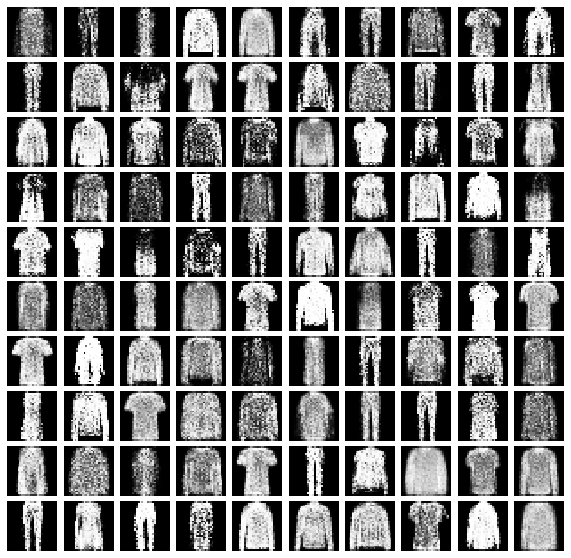

Iter: 59000
D loss: 0.6911
G_loss: 1.774
KL Div: 0.4814
Reverse KL Div: 2.637



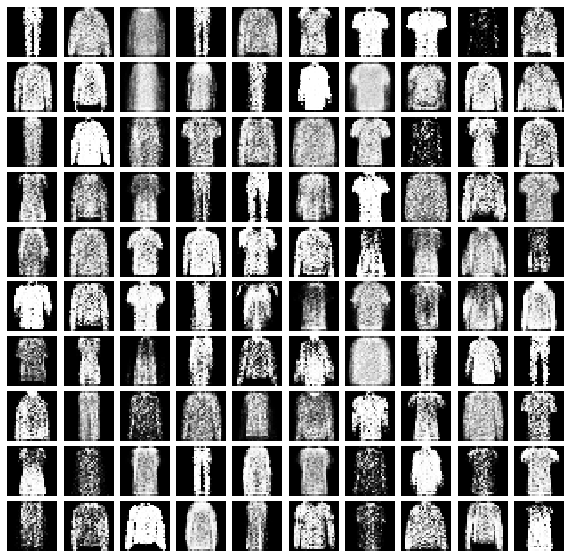

Iter: 60000
D loss: 0.8699
G_loss: 1.888
KL Div: 0.454
Reverse KL Div: 2.606



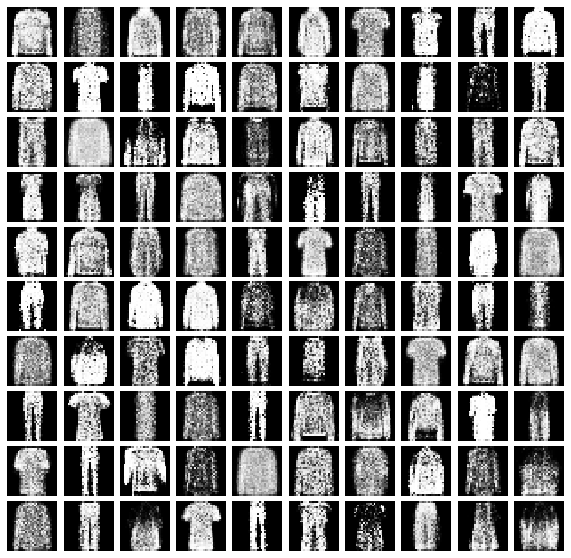

Iter: 61000
D loss: 0.8639
G_loss: 1.777
KL Div: 0.4553
Reverse KL Div: 2.617



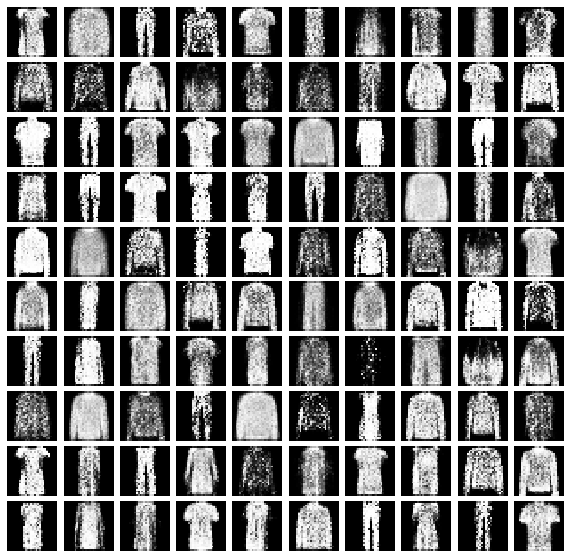

Iter: 62000
D loss: 1.096
G_loss: 1.712
KL Div: 0.4199
Reverse KL Div: 2.579



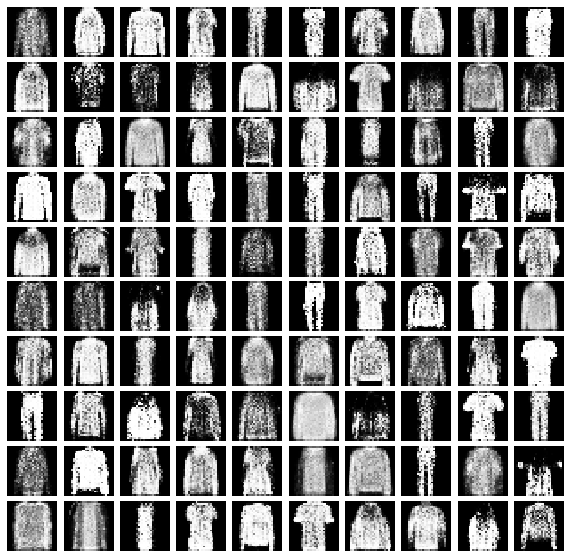

Iter: 63000
D loss: 0.956
G_loss: 1.33
KL Div: 0.4287
Reverse KL Div: 2.576



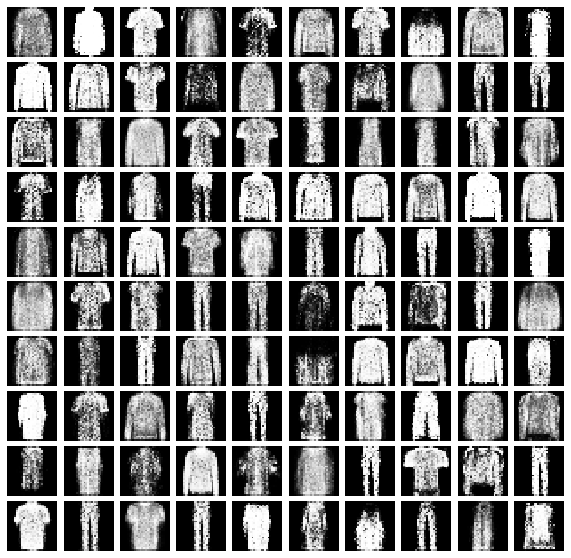

Iter: 64000
D loss: 1.075
G_loss: 1.402
KL Div: 0.4069
Reverse KL Div: 2.557



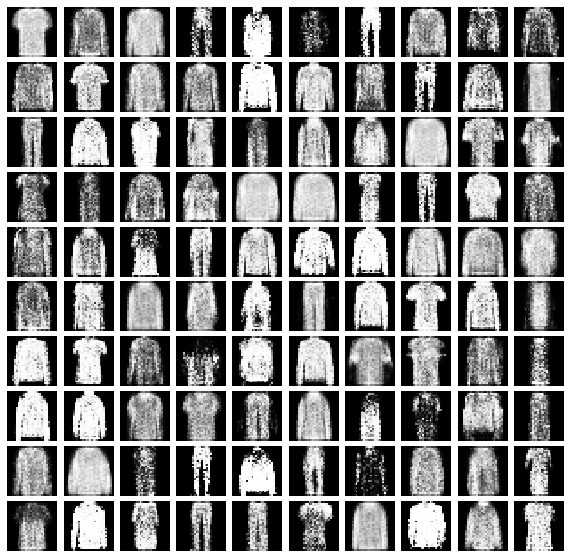

Iter: 65000
D loss: 1.126
G_loss: 1.517
KL Div: 0.4163
Reverse KL Div: 2.568



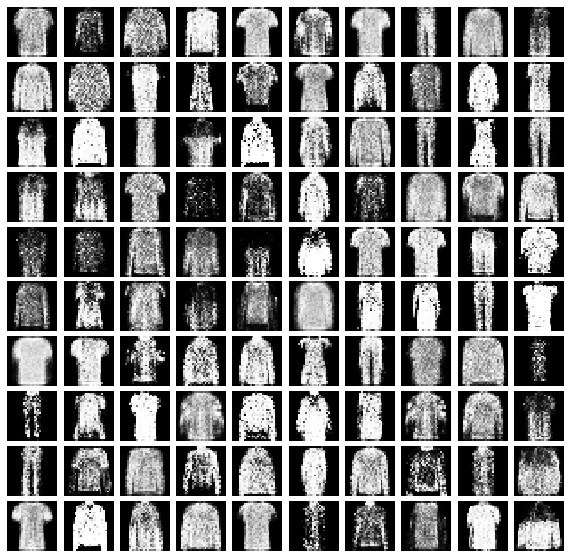

Iter: 66000
D loss: 1.071
G_loss: 1.251
KL Div: 0.4616
Reverse KL Div: 2.598



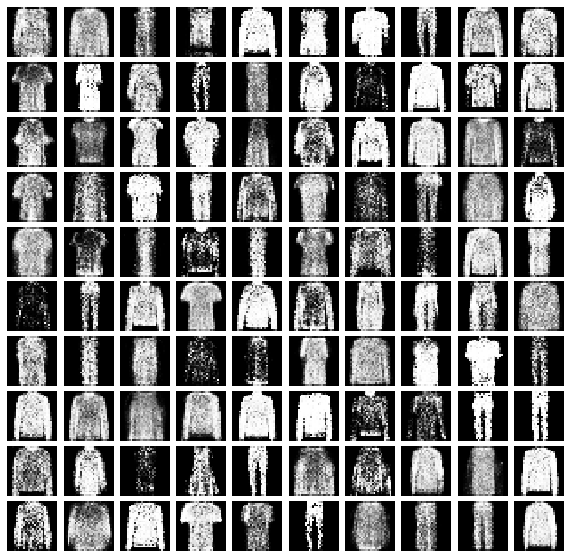

Iter: 67000
D loss: 0.8257
G_loss: 1.546
KL Div: 0.4666
Reverse KL Div: 2.623



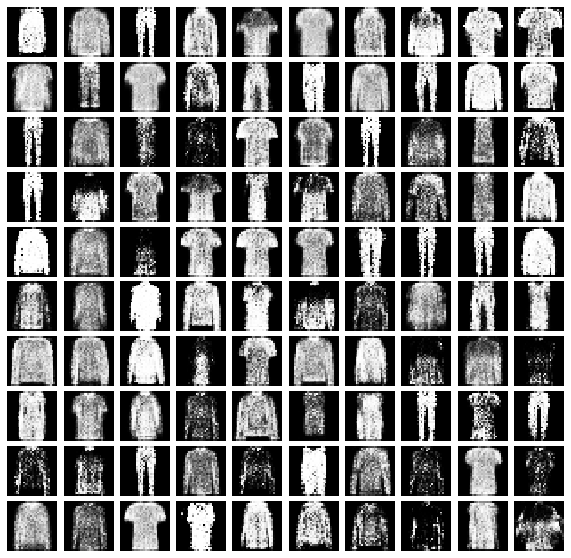

Iter: 68000
D loss: 0.7578
G_loss: 1.566
KL Div: 0.4338
Reverse KL Div: 2.582



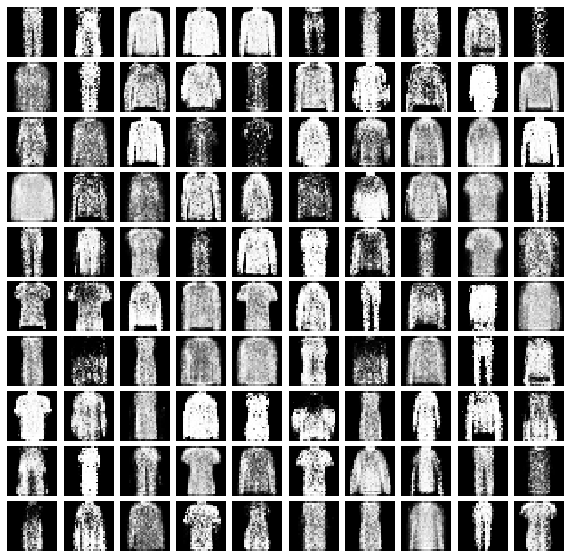

Iter: 69000
D loss: 0.9154
G_loss: 1.829
KL Div: 0.4755
Reverse KL Div: 2.661



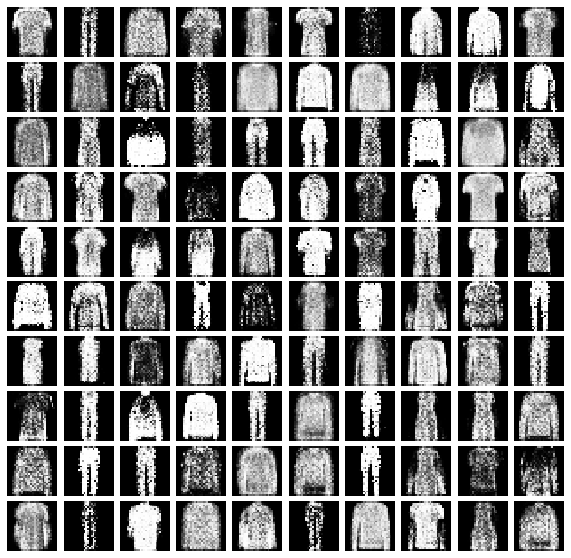

Iter: 70000
D loss: 0.8848
G_loss: 1.833
KL Div: 0.4477
Reverse KL Div: 2.595



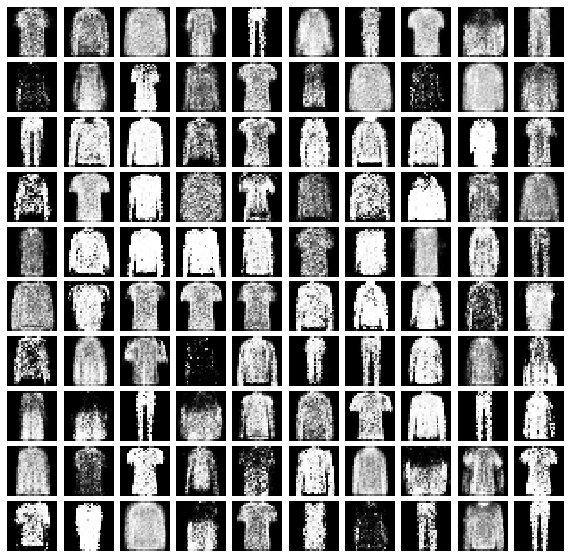

Iter: 71000
D loss: 0.8904
G_loss: 1.5
KL Div: 0.4291
Reverse KL Div: 2.583



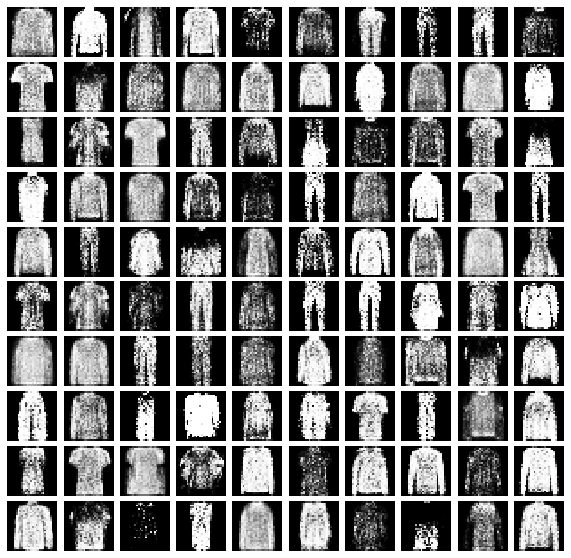

Iter: 72000
D loss: 0.9715
G_loss: 1.732
KL Div: 0.4543
Reverse KL Div: 2.609



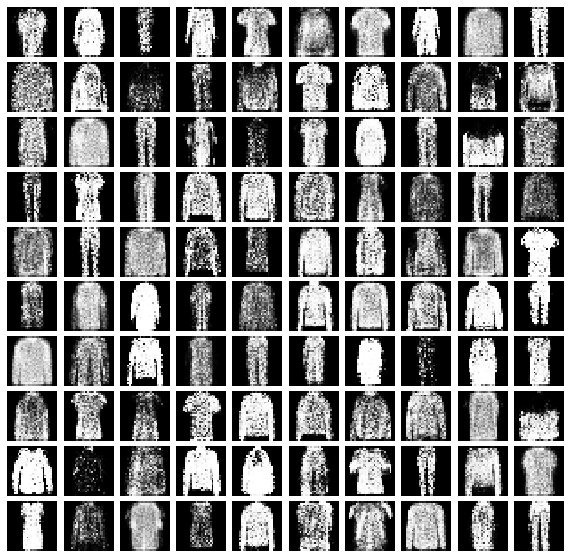

Iter: 73000
D loss: 0.873
G_loss: 1.71
KL Div: 0.4401
Reverse KL Div: 2.593



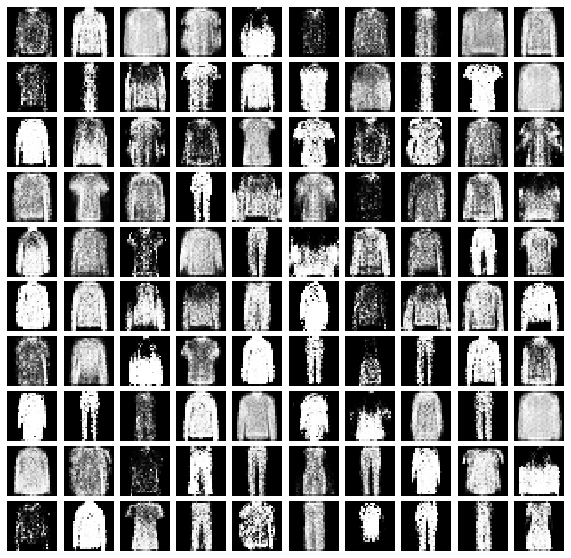

Iter: 74000
D loss: 0.9774
G_loss: 1.38
KL Div: 0.4477
Reverse KL Div: 2.604



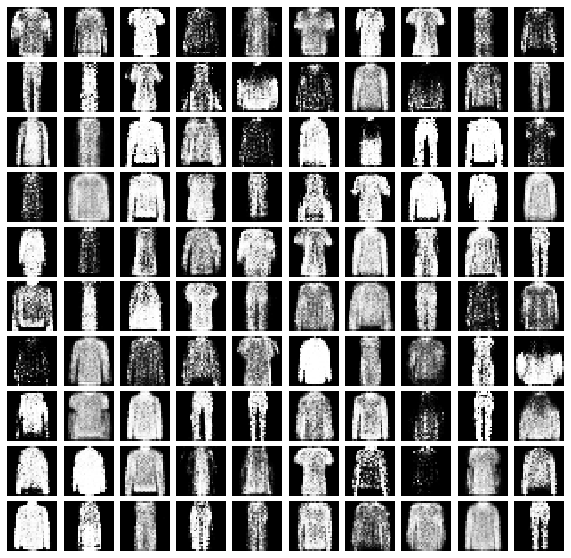

Iter: 75000
D loss: 1.055
G_loss: 1.224
KL Div: 0.4767
Reverse KL Div: 2.647



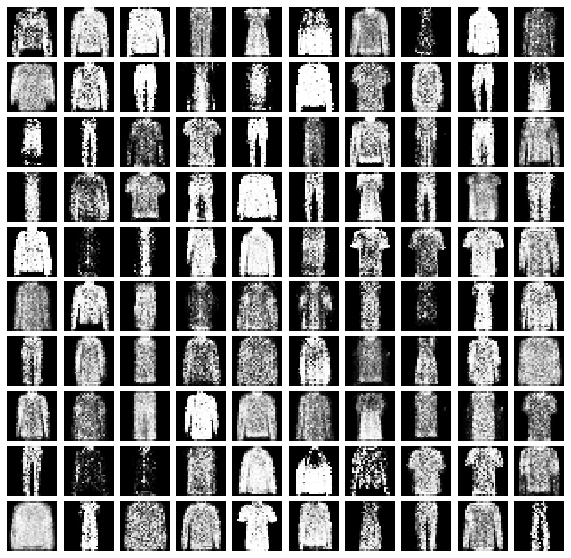

Iter: 76000
D loss: 0.993
G_loss: 1.417
KL Div: 0.456
Reverse KL Div: 2.618



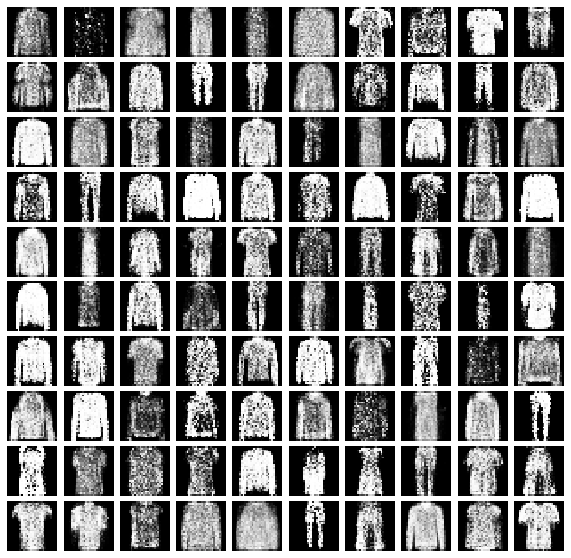

Iter: 77000
D loss: 0.7564
G_loss: 1.627
KL Div: 0.4727
Reverse KL Div: 2.622



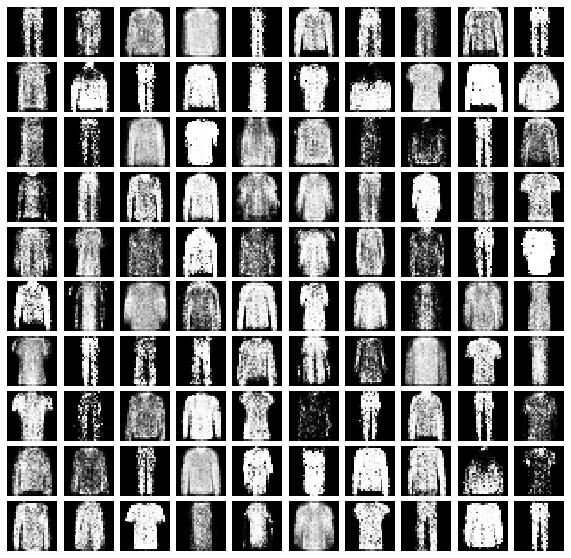

Iter: 78000
D loss: 1.068
G_loss: 1.249
KL Div: 0.4749
Reverse KL Div: 2.608



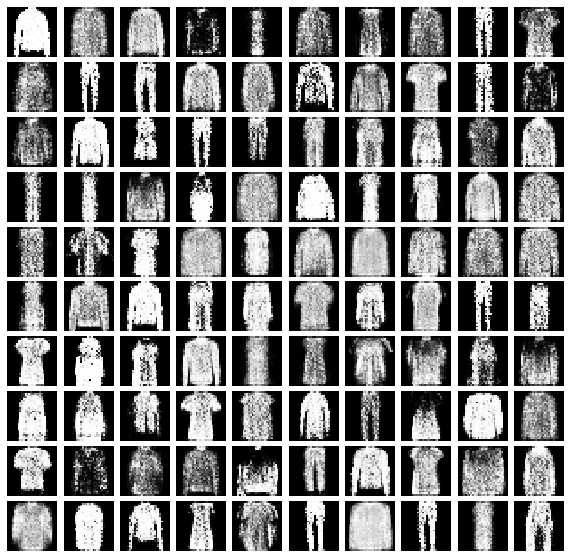

Iter: 79000
D loss: 0.6965
G_loss: 1.904
KL Div: 0.4459
Reverse KL Div: 2.589



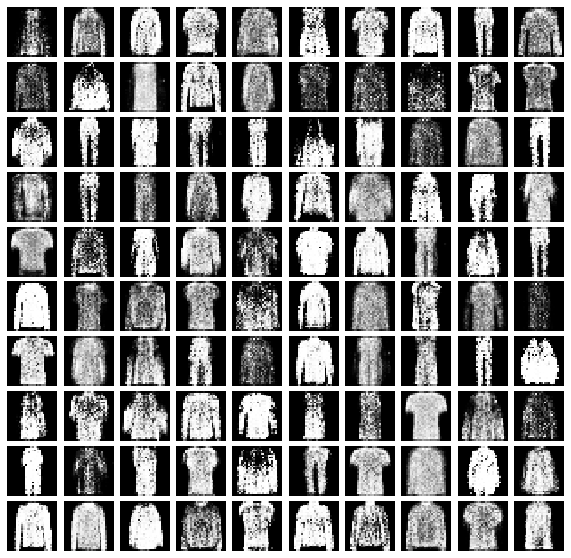

Iter: 80000
D loss: 1.061
G_loss: 1.678
KL Div: 0.4405
Reverse KL Div: 2.592



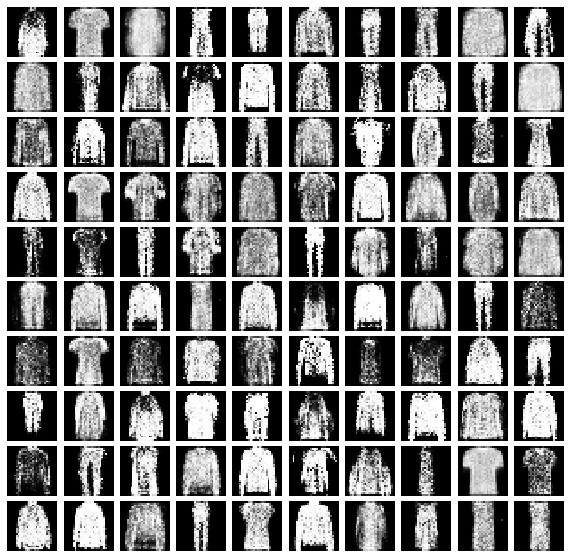

Iter: 81000
D loss: 1.145
G_loss: 1.358
KL Div: 0.4506
Reverse KL Div: 2.605



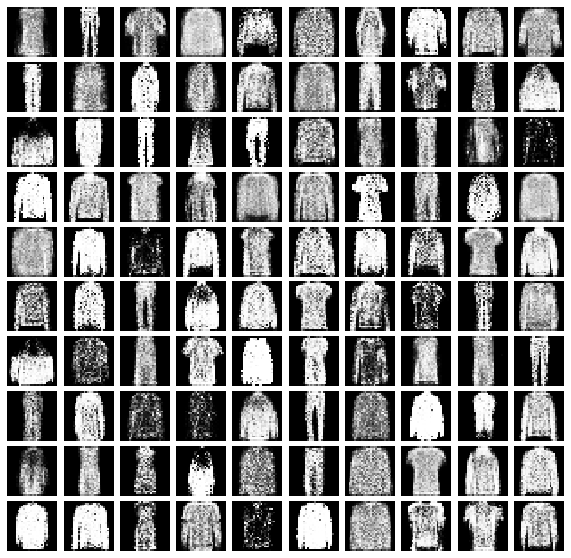

Iter: 82000
D loss: 0.9321
G_loss: 1.476
KL Div: 0.4442
Reverse KL Div: 2.602



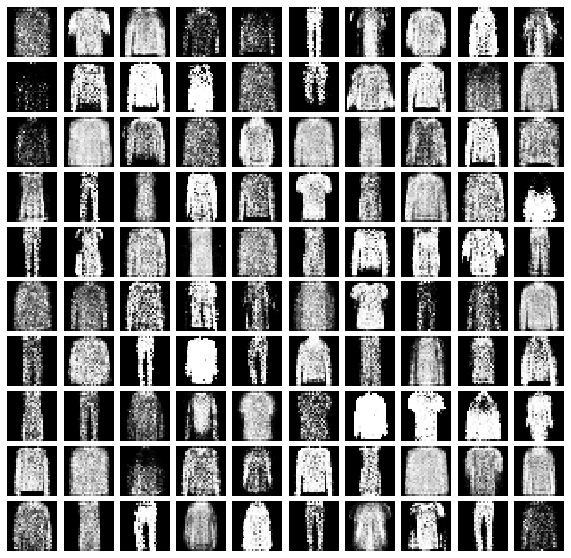

Iter: 83000
D loss: 0.8099
G_loss: 1.45
KL Div: 0.4908
Reverse KL Div: 2.7



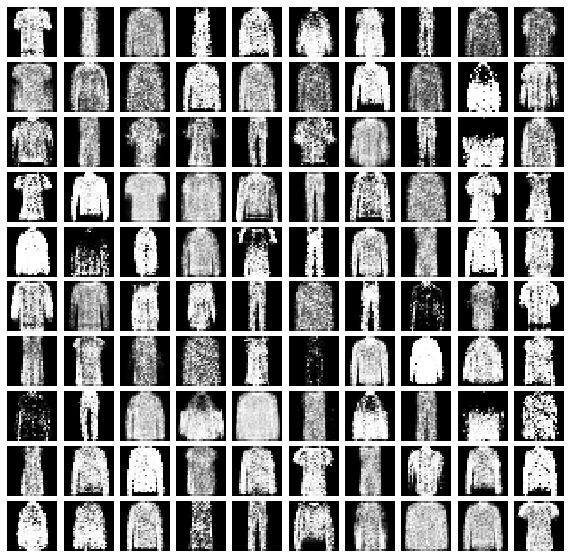

Iter: 84000
D loss: 0.8683
G_loss: 1.6
KL Div: 0.4804
Reverse KL Div: 2.647



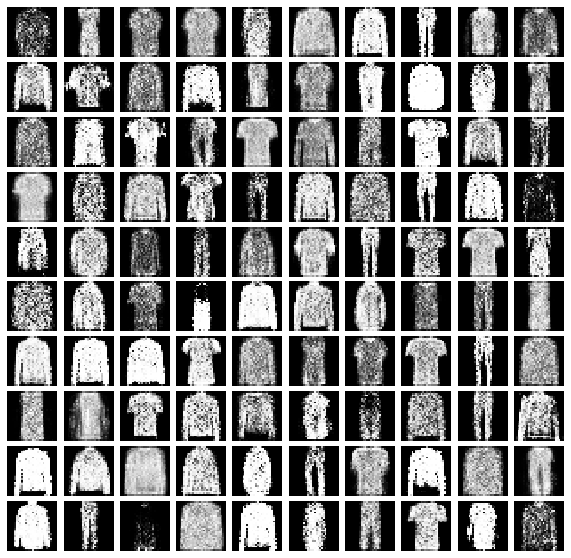

Iter: 85000
D loss: 1.028
G_loss: 1.621
KL Div: 0.4323
Reverse KL Div: 2.575



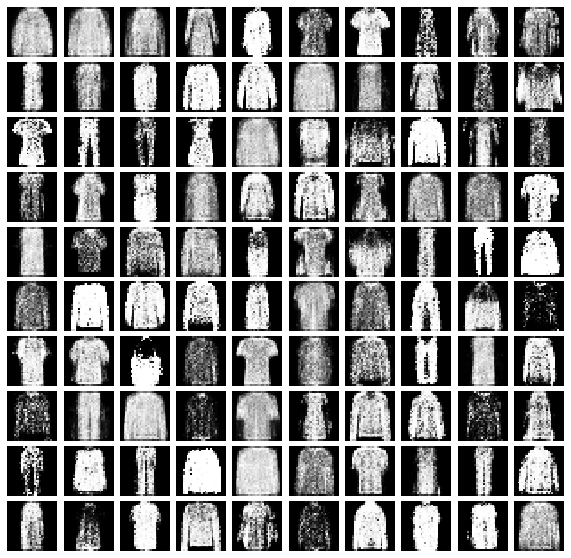

Iter: 86000
D loss: 1.024
G_loss: 1.44
KL Div: 0.4414
Reverse KL Div: 2.6



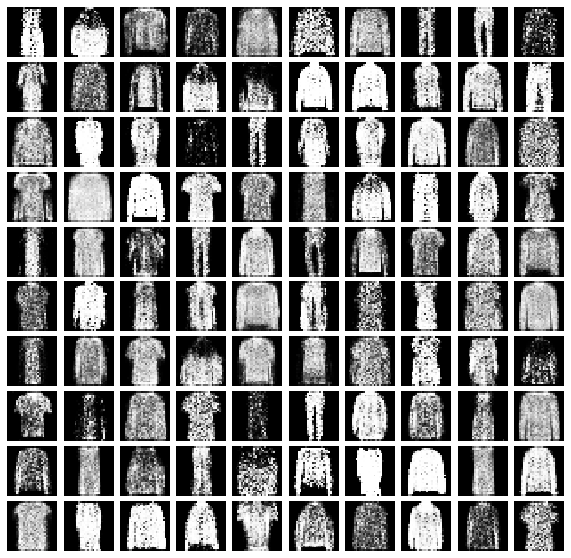

Iter: 87000
D loss: 1.021
G_loss: 1.353
KL Div: 0.4197
Reverse KL Div: 2.564



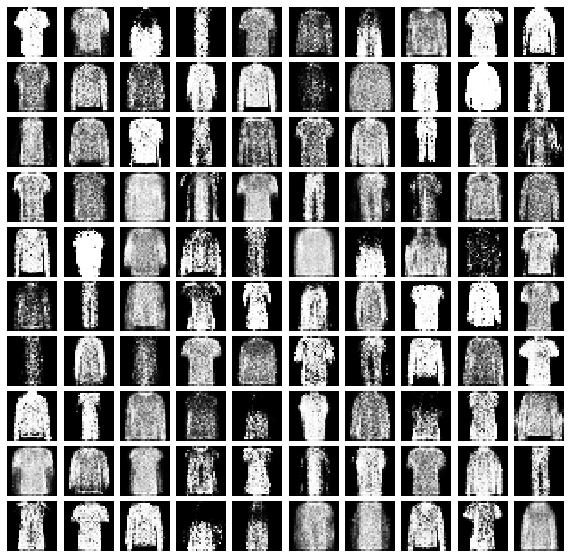

Iter: 88000
D loss: 1.108
G_loss: 1.337
KL Div: 0.4281
Reverse KL Div: 2.571



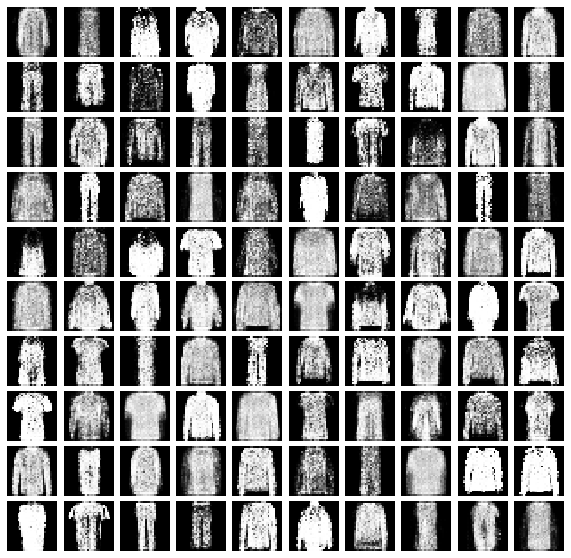

Iter: 89000
D loss: 0.7736
G_loss: 1.419
KL Div: 0.411
Reverse KL Div: 2.564



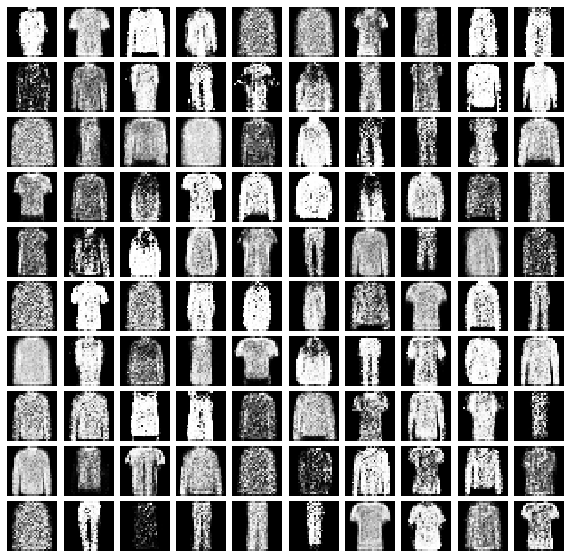

Iter: 90000
D loss: 0.7977
G_loss: 1.834
KL Div: 0.4278
Reverse KL Div: 2.572



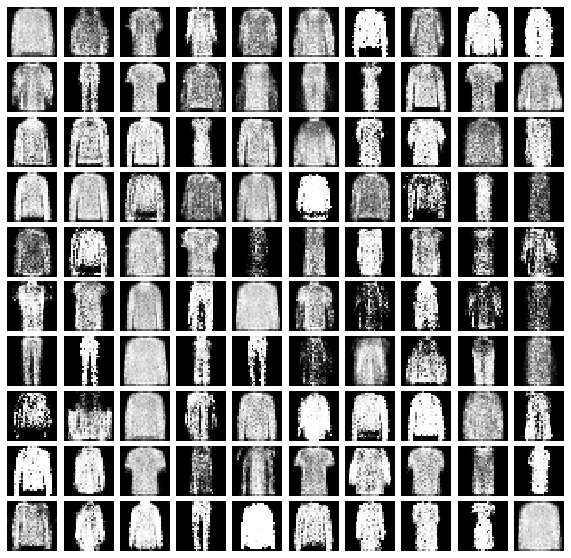

Iter: 91000
D loss: 0.9127
G_loss: 1.733
KL Div: 0.4351
Reverse KL Div: 2.588



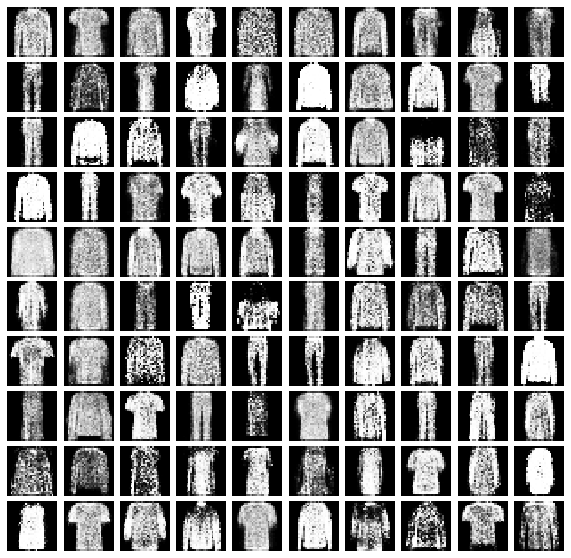

Iter: 92000
D loss: 0.7825
G_loss: 1.838
KL Div: 0.4567
Reverse KL Div: 2.61



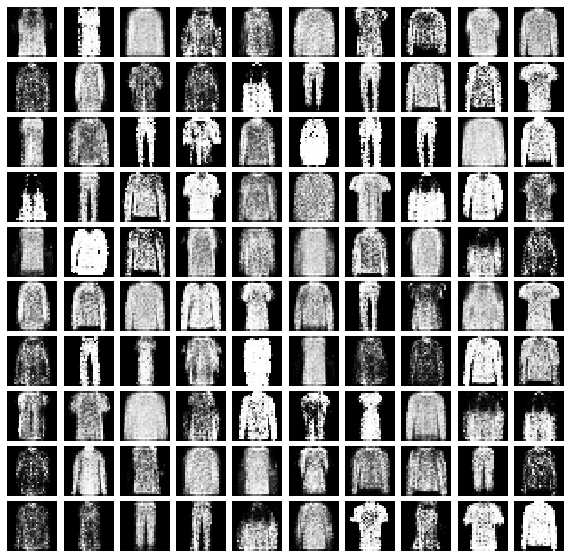

Iter: 93000
D loss: 1.043
G_loss: 1.336
KL Div: 0.4235
Reverse KL Div: 2.576



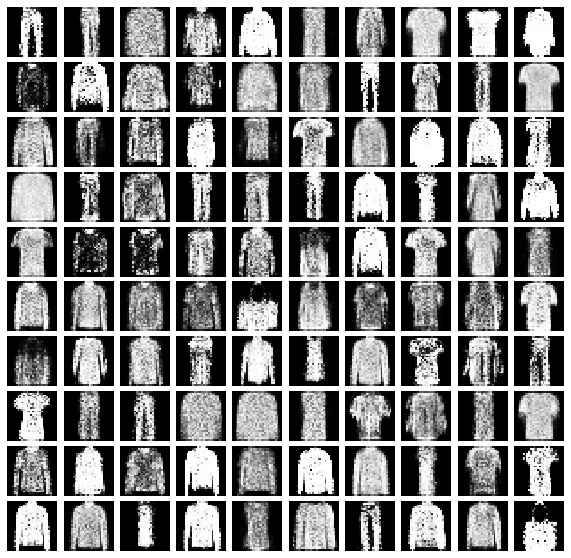

Iter: 94000
D loss: 1.021
G_loss: 1.311
KL Div: 0.494
Reverse KL Div: 2.62



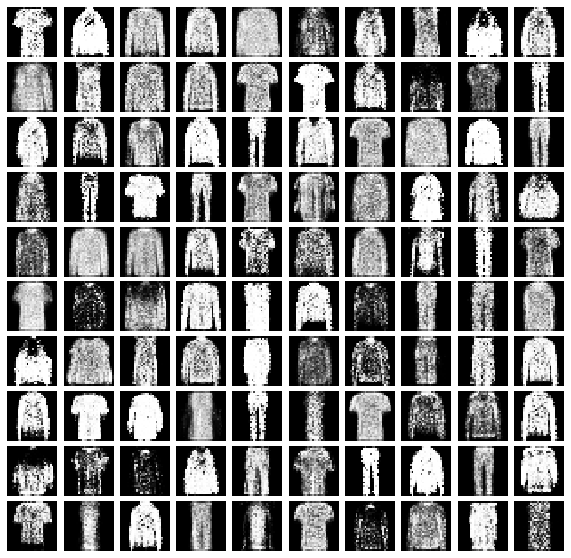

Iter: 95000
D loss: 1.065
G_loss: 1.385
KL Div: 0.5133
Reverse KL Div: 2.771



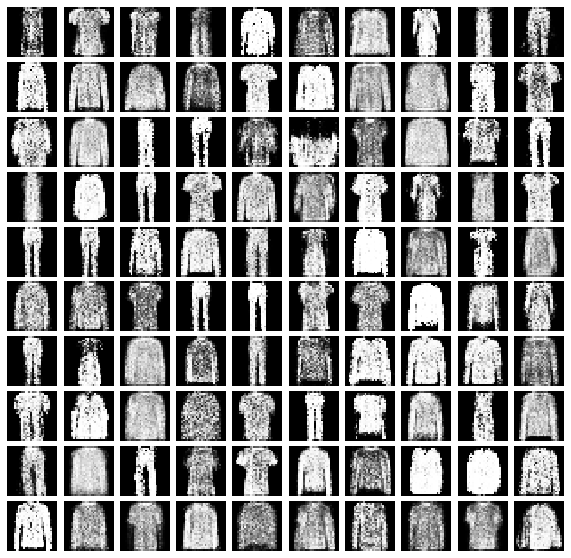

Iter: 96000
D loss: 1.038
G_loss: 1.197
KL Div: 0.4585
Reverse KL Div: 2.622



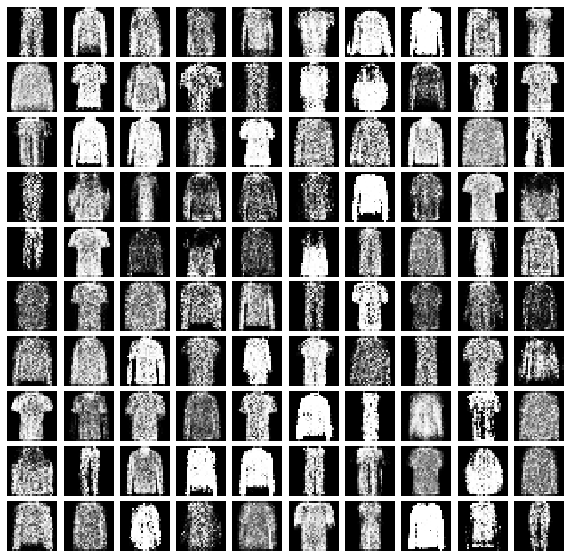

Iter: 97000
D loss: 0.7917
G_loss: 1.767
KL Div: 0.4642
Reverse KL Div: 2.615



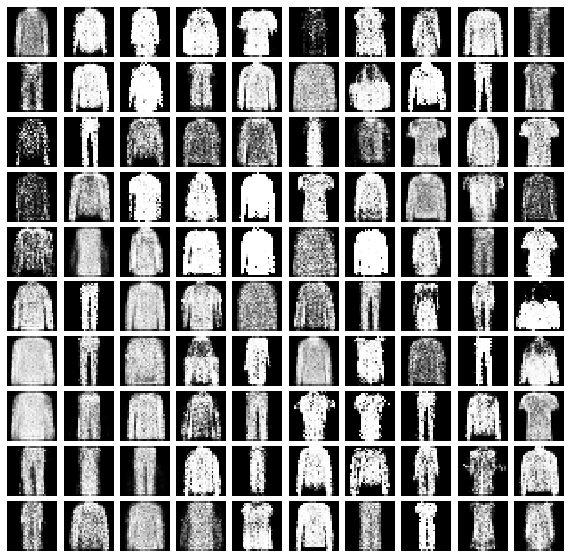

Iter: 98000
D loss: 1.097
G_loss: 1.277
KL Div: 0.4635
Reverse KL Div: 2.615



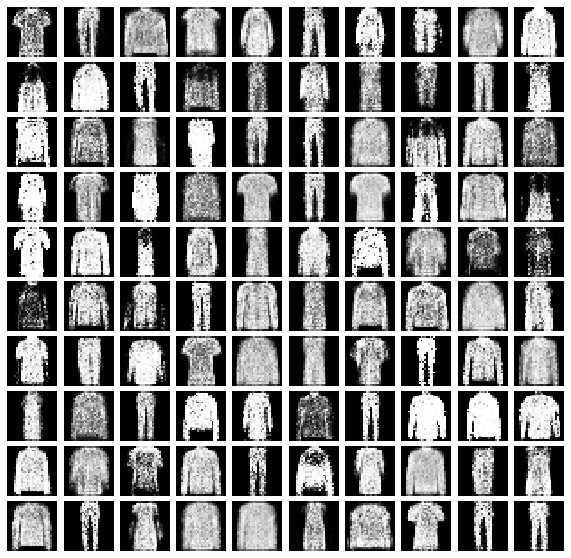

Iter: 99000
D loss: 0.9153
G_loss: 1.42
KL Div: 0.4112
Reverse KL Div: 2.557



In [0]:
i = 0
g_losses, d_losses, kls, rev_kls, pds, mcs = [], [], [], [], [], []
for it in range(100000):
    if it % 1000 == 0:
        samples = sess.run(G_sample, feed_dict={Z: sample_Z(100, Z_dim)})
        
        fig = plot(samples)
        plt.show(fig)
        plt.savefig('out/{}.png'.format(str(i).zfill(3)), bbox_inches='tight')
        i += 1
        plt.close(fig)
        
    X_mb, _ = mnist.train.next_batch(mb_size)

    _, D_loss_curr = sess.run([D_solver, D_loss], feed_dict={X: X_mb, Z: sample_Z(mb_size, Z_dim)})
    _, G_loss_curr = sess.run([G_solver, G_loss], feed_dict={Z: sample_Z(mb_size, Z_dim)})

    if it % 1000 == 0:
        kl_samples = sess.run(G_sample, feed_dict={Z: sample_Z(200, Z_dim)})
        kl, rev_kl, pd, mc = kl_divergence(kl_samples)
        print('Iter: {}'.format(it))
        print('D loss: {:.4}'. format(D_loss_curr))
        print('G_loss: {:.4}'.format(G_loss_curr))
        print('KL Div: {:.4}'.format(kl))
        print('Reverse KL Div: {:.4}'.format(rev_kl))
        g_losses.append(D_loss_curr)
        d_losses.append(G_loss_curr)
        kls.append(kl)
        rev_kls.append(rev_kl)
        pds.append(pd)
        mcs.append(mc)
        print()

## Metric Evaluation

In [0]:
# Jensen-Shanon Divergence
tiny_e = 1e-5

m = (pds + np.full_like(pds,0.1))/2
m_epsilon = m + tiny_e
gen_pd_epsilon = np.array(pds) + tiny_e
data_pd_epsilon = np.full_like(pds,0.1) + tiny_e

kl_g_m = np.sum(gen_pd_epsilon * np.log(gen_pd_epsilon / m_epsilon), axis=1)
kl_d_m = np.sum(data_pd_epsilon * np.log(data_pd_epsilon / m_epsilon), axis=1)

jsd = (kl_g_m/2) + (kl_d_m/2)
print(jsd.shape)

(100,)


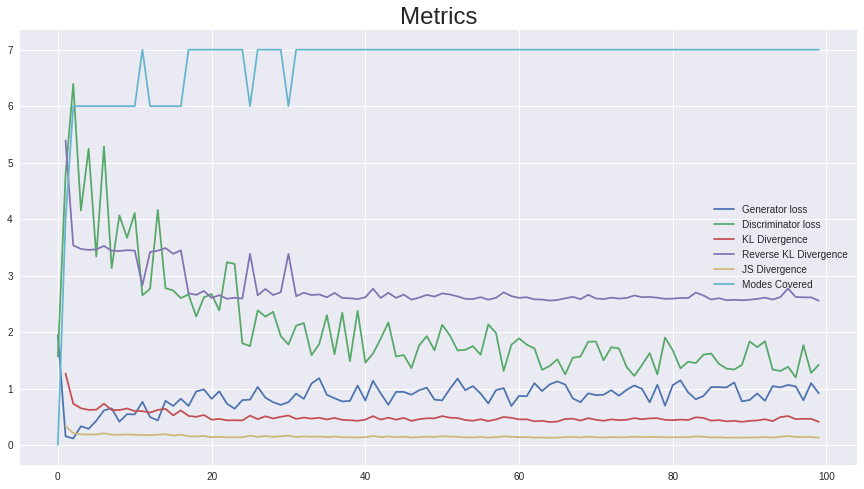

In [0]:
fig = plt.figure(figsize=(15,8))

for (metric, label) in zip([g_losses, d_losses, kls, rev_kls, jsd, mcs], ['Generator loss', 'Discriminator loss', 'KL Divergence', 'Reverse KL Divergence', 'JS Divergence', 'Modes Covered']):
  
  plt.plot(metric, label=label)
  plt.title('Metrics', fontsize=24)
  plt.legend()

plt.savefig("metrics.png")
plt.show()

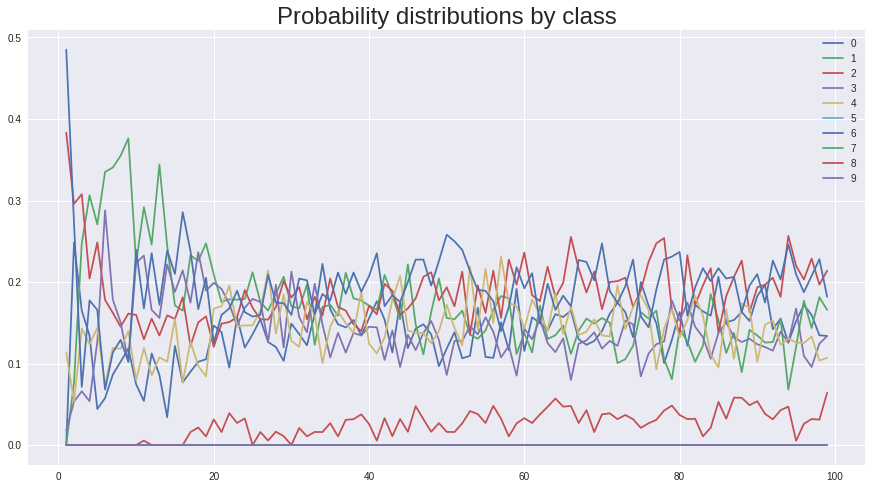

In [0]:
# plot probability distributions

fig = plt.figure(figsize=(15,8))

for (digit, label) in zip(np.array(pds).T, range(10)):
  
  plt.plot(digit, label=label)
  plt.title('Probability distributions by class', fontsize=24)
  plt.legend()

plt.savefig("prob_distr.png")
plt.show()


## Download

In [0]:
from google.colab import files

metrics_list = [(g_losses, "g_losses"),
(d_losses, "d_losses"),
(kls, "kl_divergences"),
(rev_kls, "rev_kl_divergences"),
(pds, "prob_distributions"),
(jsd, "js_divergences"),
(mcs, "modes_covered")]

for (metric, label) in metrics_list:
  with open(label+'.txt', 'w') as f:
    f.write(str(metric))
  files.download(label+'.txt')

KeyboardInterrupt: ignored

In [0]:
files.download("prob_distr.png")
files.download("metrics.png")